##LATAR BELAKANG

Kepala Satuan Polisi *The Boston Police Department* **(BPD)** membutuhkan seorang konsultan *data analyst* untuk menganalisa seberapa optimal kinerja tim polisi BPD terhadap insiden yang terjadi di kota Boston, Massachusetts pada periode 14 Juni 2015 - 3 Sept 2018. Hasil analisa serta insight yang diberikan akan sangat berguna untuk mengoptimalkan kinerja polisi yang akan melakukan patroli dan yang akan bersiaga di tiap titik/lokasi yang (khususnya) memiliki tingkat kriminalitas tinggi. Lebih dari itu, hasil analisa dan insight diharapkan dapat mengidentifikasi tindakan/respon apa yang selama ini sering dilakukan oleh tim BPD guna mengantisipasi terhadap insiden yang terjadi serta untuk menyesuaikan terhadap program pelatihan yang sesuai di masa yang akan datang.

## RUMUSAN MASALAH

Kepala Satuan Polisi BPD ingin mengetahui tingkat efisiensi kinerja officer selama menghadapi tindakan kriminal di area kota Boston dalam periode 14 Juni 2015 - 3 Sept 2018. Informasi ini akan membantu guna optimalisasi kinerja dengan melakukan pemetaan tindak kriminalitas di periode mendatang.

Sebagai seorang data analyst, kita akan mencoba menjawab pertanyaan berikut
> *Bagaimana tingkat efisiensi BPD dalam menangani kasus yang terjadi pada setiap district di kota Boston?*

> *Apa rekomendasi yang dapat diberikan untuk meningkatkan kinerja BPD serta menurunkan angka kriminalitas di kota Boston?*




## DATA

Untuk menjawab pertanyaan diatas, kita akan menganalisa data yang telah dikumpulkan oleh The Boston Police Department.
Dataset dapat diakses [di sini](https://www.kaggle.com/datasets/AnalyzeBoston/crimes-in-boston).



In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from scipy.stats import normaltest, chi2_contingency, mannwhitneyu, ttest_ind
import folium
import json
import warnings
warnings.filterwarnings("ignore")

Dataset ini berisikan catatan dari sistem laporan insiden kejahatan baru yang mencakup nomor insiden, jenis kejahatan, kategori kejahata, dimana terjadinya, dan kapan itu terjadi.

In [2]:
#upload data

from google.colab import files
uploaded = files.upload()

Saving offense_codes.csv to offense_codes.csv
Saving crime.csv to crime.csv


Berikut 5 baris teratas dari dataset crime

In [3]:
dfc = pd.read_csv('crime.csv',encoding="ISO-8859-1")
dfc.head()

,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,STREET,Lat,Long,Location
0,I182070945,619,Larceny,LARCENY ALL OTHERS,D14,808,NaN,2018-09-02 13:00:00,2018,9,Sunday,13,Part One,LINCOLN ST,42.357791,-71.139371,"(42.35779134, -71.13937053)"
1,I182070943,1402,Vandalism,VANDALISM,C11,347,NaN,2018-08-21 00:00:00,2018,8,Tuesday,0,Part Two,HECLA ST,42.306821,-71.060300,"(42.30682138, -71.06030035)"
2,I182070941,3410,Towed,TOWED MOTOR VEHICLE,D4,151,NaN,2018-09-03 19:27:00,2018,9,Monday,19,Part Three,CAZENOVE ST,42.346589,-71.072429,"(42.34658879, -71.07242943)"
3,I182070940,3114,Investigate Property,INVESTIGATE PROPERTY,D4,272,NaN,2018-09-03 21:16:00,2018,9,Monday,21,Part Three,NEWCOMB ST,42.334182,-71.078664,"(42.33418175, -71.07866441)"
4,I182070938,3114,Investigate Property,INVESTIGATE PROPERTY,B3,421,NaN,2018-09-03 21:05:00,2018,9,Monday,21,Part Three,DELHI ST,42.275365,-71.090361,"(42.27536542, -71.09036101)"


Berikut dataset offense_codes

In [4]:
# Dataset Offense Codes
dfoc = pd.read_csv('offense_codes.csv', encoding = "ISO-8859-1")

# Ubah nama kolom agar menyesuaikan dataset crimes
dfoc['OFFENSE_CODE'] = dfoc['CODE']
dfoc.drop('CODE', axis = 1, inplace = True)

#Urutkan data agar menyesuaikan column offense_code
dfoc.sort_values('OFFENSE_CODE', inplace = True)

#Tampilkan duplikat dalam data (jika ada)
dfoc_duplicate = dfoc[dfoc.duplicated()==True]
dfoc_duplicate

,NAME,OFFENSE_CODE
184,KILLING OF FELON BY POLICE,112
155,KILLING OF POLICE BY FELON,114
15,MANSLAUGHTER - VEHICLE - NEGLIGENCE,121
14,MANSLAUGHTER - NON-VEHICLE - NEGLIGENCE,123
94,AUTO THEFT,724
...,...,...
448,MISSING PERSON,3501
449,MISSING PERSON - LOCATED,3502
450,MISSING PERSON - NOT REPORTED - LOCATED,3503
55,REPORT AFFECTING OTHER DEPTS.,3620


In [5]:
#eliminasi 83 baris yang memiliki values sama

dfoc.drop_duplicates(subset = 'OFFENSE_CODE', keep = 'first', inplace = True)
dfoc.head()

,NAME,OFFENSE_CODE
183,MURDER NON-NEGLIGIENT MANSLAUGHTER,111
154,KILLING OF FELON BY POLICE,112
542,KILLING OF FELON BY CITIZEN,113
185,KILLING OF POLICE BY FELON,114
186,MANSLAUGHTER - VEHICLE - NEGLIGENCE,121


In [6]:
#gabung data crimes dan offense codes

df = pd.merge(dfc, dfoc, on = 'OFFENSE_CODE', how = 'left').sort_values('OFFENSE_CODE')
df.head()

,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,STREET,Lat,Long,Location,NAME
62808,I182003714,111,Homicide,"MURDER, NON-NEGLIGIENT MANSLAUGHTER",C11,362,Y,2018-01-14 17:30:00,2018,1,Sunday,17,Part One,LAFAYETTE PARK,NaN,NaN,"(0.00000000, 0.00000000)",MURDER NON-NEGLIGIENT MANSLAUGHTER
16116,I182053414,111,Homicide,"MURDER, NON-NEGLIGIENT MANSLAUGHTER",B2,316,Y,2018-07-07 15:06:00,2018,7,Saturday,15,Part One,HOMESTEAD ST,42.312421,-71.091549,"(42.31242132, -71.09154902)",MURDER NON-NEGLIGIENT MANSLAUGHTER
307409,I152062504,111,Homicide,"MURDER, NON-NEGLIGIENT MANSLAUGHTER",B2,330,Y,2015-07-28 22:32:00,2015,7,Tuesday,22,Part One,SEAVER ST,42.305054,-71.084036,"(42.30505376, -71.08403633)",MURDER NON-NEGLIGIENT MANSLAUGHTER
105930,I172065378,111,Homicide,"MURDER, NON-NEGLIGIENT MANSLAUGHTER",B2,237,Y,2017-08-09 22:33:00,2017,8,Wednesday,22,Part One,ELDER ST,42.320229,-71.063071,"(42.32022882, -71.06307063)",MURDER NON-NEGLIGIENT MANSLAUGHTER
78225,I172094879,111,Homicide,"MURDER, NON-NEGLIGIENT MANSLAUGHTER",C11,949,NaN,2017-11-20 15:35:00,2017,11,Monday,15,Part One,BOWDOIN ST,42.308394,-71.064731,"(42.30839354, -71.06473124)",MURDER NON-NEGLIGIENT MANSLAUGHTER


**Dari data diatas jika dilihat sepintas column `OFFENSE_DESCRIPTION` sama dengan column `NAME`**

cek terlebih dahulu dengan syntax dibawah

In [7]:
pd.crosstab(index = [df['OFFENSE_DESCRIPTION'], df['NAME']], columns = 'TOTAL_CASES')

,col_0,TOTAL_CASES
OFFENSE_DESCRIPTION,NAME,
"A&B HANDS, FEET, ETC. - MED. ATTENTION REQ.","A&B HANDS, FEET, ETC. - MED. ATTENTION REQ.",1
A&B ON POLICE OFFICER,A&B ON POLICE OFFICER,3
ABDUCTION - INTICING,ABDUCTION - INTICING,12
AFFRAY,AFFRAY,249
AIRCRAFT INCIDENTS,AIRCRAFT INCIDENTS,36
...,...,...
"WEAPON - FIREARM - CARRYING / POSSESSING, ETC",FIREARM/WEAPON - CARRY - SELL - RENT,899
WEAPON - FIREARM - OTHER VIOLATION,WEAPON - FIREARM - OTHER VIOLATION,238
WEAPON - FIREARM - SALE / TRAFFICKING,WEAPON - FIREARM - SALE / TRAFFICKING,13


**Hasil crosstab menunjukkan data sama**

- gunakan column `NAME` sebagai deskripsi tindak kriminal karena sudah dilakukan data cleaning

- kemudian delete column `OFFENSE_DESCRIPTION` agar tidak ada data double

In [8]:
df.drop('OFFENSE_DESCRIPTION', axis = 1, inplace = True)
df.rename({'NAME':'OFFENSE_DESCRIPTION'}, inplace = True)
df.head()

,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_CODE_GROUP,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,STREET,Lat,Long,Location,NAME
62808,I182003714,111,Homicide,C11,362,Y,2018-01-14 17:30:00,2018,1,Sunday,17,Part One,LAFAYETTE PARK,NaN,NaN,"(0.00000000, 0.00000000)",MURDER NON-NEGLIGIENT MANSLAUGHTER
16116,I182053414,111,Homicide,B2,316,Y,2018-07-07 15:06:00,2018,7,Saturday,15,Part One,HOMESTEAD ST,42.312421,-71.091549,"(42.31242132, -71.09154902)",MURDER NON-NEGLIGIENT MANSLAUGHTER
307409,I152062504,111,Homicide,B2,330,Y,2015-07-28 22:32:00,2015,7,Tuesday,22,Part One,SEAVER ST,42.305054,-71.084036,"(42.30505376, -71.08403633)",MURDER NON-NEGLIGIENT MANSLAUGHTER
105930,I172065378,111,Homicide,B2,237,Y,2017-08-09 22:33:00,2017,8,Wednesday,22,Part One,ELDER ST,42.320229,-71.063071,"(42.32022882, -71.06307063)",MURDER NON-NEGLIGIENT MANSLAUGHTER
78225,I172094879,111,Homicide,C11,949,NaN,2017-11-20 15:35:00,2017,11,Monday,15,Part One,BOWDOIN ST,42.308394,-71.064731,"(42.30839354, -71.06473124)",MURDER NON-NEGLIGIENT MANSLAUGHTER


##DATA UNDERSTANDING & DATA CLEANING

Data understanding digunakan untuk mengetahui anomali-anomali apa saja yang terdapat di dalam dataset kita dan perlu ditangani dalam tahapan data cleaning. Setiap penangan anomali yang dilakukan, akan disertai dengan justifikasi langkah yang diambil, baik secara domain knowledge maupun secara statistik.

### Tabel

In [9]:
#cek bentuk tabel
print(f'Dataset terbentuk dari {df.shape[0]} baris dan {df.shape[1]} kolom')
#cek info dalam tabel 
df.info()

Dataset terbentuk dari 319073 baris dan 17 kolom
<class 'pandas.core.frame.DataFrame'>
Int64Index: 319073 entries, 62808 to 33161
Data columns (total 17 columns):
 #   Column              Non-Null Count   Dtype  
---  ------              --------------   -----  
 0   INCIDENT_NUMBER     319073 non-null  object 
 1   OFFENSE_CODE        319073 non-null  int64  
 2   OFFENSE_CODE_GROUP  319073 non-null  object 
 3   DISTRICT            317308 non-null  object 
 4   REPORTING_AREA      319073 non-null  object 
 5   SHOOTING            1019 non-null    object 
 6   OCCURRED_ON_DATE    319073 non-null  object 
 7   YEAR                319073 non-null  int64  
 8   MONTH               319073 non-null  int64  
 9   DAY_OF_WEEK         319073 non-null  object 
 10  HOUR                319073 non-null  int64  
 11  UCR_PART            318983 non-null  object 
 12  STREET              308202 non-null  object 
 13  Lat                 299074 non-null  float64
 14  Long                299074 non-n

In [10]:
#describe kolom dalam tabel
display(df.describe(), df.describe(include = 'object'))

,OFFENSE_CODE,YEAR,MONTH,HOUR,Lat,Long
count,319073.000000,319073.000000,319073.000000,319073.000000,299074.000000,299074.000000
mean,2317.546956,2016.560586,6.609719,13.118205,42.214381,-70.908272
std,1185.285543,0.996344,3.273691,6.294205,2.159766,3.493618
min,111.000000,2015.000000,1.000000,0.000000,-1.000000,-71.178674
25%,1001.000000,2016.000000,4.000000,9.000000,42.297442,-71.097135
50%,2907.000000,2017.000000,7.000000,14.000000,42.325538,-71.077524
75%,3201.000000,2017.000000,9.000000,18.000000,42.348624,-71.062467
max,3831.000000,2018.000000,12.000000,23.000000,42.395042,-1.000000


,INCIDENT_NUMBER,OFFENSE_CODE_GROUP,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,DAY_OF_WEEK,UCR_PART,STREET,Location,NAME
count,319073,319073,317308,319073,1019,319073,319073,318983,308202,319073,319073
unique,282517,67,12,879,1,233229,7,4,4657,18194,220
top,I162030584,Motor Vehicle Accident Response,B2,,Y,2017-06-01 00:00:00,Friday,Part Three,WASHINGTON ST,"(0.00000000, 0.00000000)",M/V - LEAVING SCENE - PROPERTY DAMAGE
freq,13,37132,49945,20250,1019,29,48495,158553,14194,19999,18939


In [11]:
#deskripsikan data dengan for loop

describeData = []
for i in df.columns :
    describeData.append( [i, 
                          df[i].dtypes,df[i].isna().sum(), 
                          round((((df[i].isna().sum())/len(df))*100),2), 
                          df[i].nunique(), 
                          df[i].drop_duplicates().sample(2).values]
                        )

tabel1Desc = pd.DataFrame(columns = ['Data Features','Data Types', 'Null', 'Null Percentage', 'Unique', 'Unique Sample'],
                     data=describeData)
tabel1Desc

,Data Features,Data Types,Null,Null Percentage,Unique,Unique Sample
0,INCIDENT_NUMBER,object,0,0.00,282517,"[I182018647, I162040702]"
1,OFFENSE_CODE,int64,0,0.00,222,"[1610, 520]"
2,OFFENSE_CODE_GROUP,object,0,0.00,67,"[Property Lost, Search Warrants]"
3,DISTRICT,object,1765,0.55,12,"[C11, E18]"
4,REPORTING_AREA,object,0,0.00,879,"[671, 417]"
5,SHOOTING,object,318054,99.68,1,"[Y, nan]"
6,OCCURRED_ON_DATE,object,0,0.00,233229,"[2016-11-08 12:37:00, 2015-10-18 14:39:00]"
7,YEAR,int64,0,0.00,4,"[2017, 2016]"
8,MONTH,int64,0,0.00,12,"[7, 8]"
9,DAY_OF_WEEK,object,0,0.00,7,"[Thursday, Saturday]"


Berdasarkan data diatas, dapat disimpulkan sebagai berikut:
- tabel berisi 17 kolom dimana 6 kolom didalamnya termasuk kolom numerik, yaitu:
  - `OFFENSE_CODE`: Nomor identifikasi tindak kriminal 
  - `YEAR`, `MONTH`, `HOUR`: Data waktu kejadian kriminal
  - `LAT`, `LONG`: Koordinat TKP
- Kolom numerik bukan merupakan data yang dapat dikalkulasi lebih lanjut, maka tidak ada fungsi matematis yang dapat digunakan
- `INCIDENT_NUMBER`: Terdapat 282,517 angka unik dari total 319,073 baris dalam tabel, seharusnya menyimpan angka unik untuk setiap kejadian
- `DISTRICT`: Kota boston terbagi menjadi 12 district
- `SHOOTING`: Adanya penembakan sejumlah 1019 kasus dari total 319,073 kejadian yang dicatat

In [12]:
#duplicate value
df_duplicate = df[df.duplicated()==True]
df_duplicate

,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_CODE_GROUP,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,STREET,Lat,Long,Location,NAME
319002,I130041200-00,522,Residential Burglary,B3,428,NaN,2015-12-07 11:38:00,2015,12,Monday,11,Part One,DIXWELL ST,42.314334,-71.097914,"(42.31433402, -71.09791405)",B&E RESIDENCE DAY - NO FORCE
318893,I142016089-00,613,Larceny,C11,388,NaN,2015-10-10 09:30:00,2015,10,Saturday,9,Part One,DORCHESTER AVE,42.278399,-71.066363,"(42.27839920, -71.06636305)",LARCENY SHOPLIFTING $200 & OVER
318992,I130194606-00,617,Larceny,D4,136,NaN,2016-02-02 19:30:00,2016,2,Tuesday,19,Part One,COMMONWEALTH AVE,42.351153,-71.081614,"(42.35115300, -71.08161374)",LARCENY IN A BUILDING $200 & OVER
319024,I120470733-00,724,Auto Theft,C6,205,NaN,2016-09-23 19:15:00,2016,9,Friday,19,Part One,A ST,42.346953,-71.051127,"(42.34695268, -71.05112684)",AUTO THEFT
319034,I120189428-00,802,Simple Assault,E13,303,NaN,2015-12-09 18:35:00,2015,12,Wednesday,18,Part Two,AMORY ST,42.318245,-71.101268,"(42.31824501, -71.10126771)",ASSAULT & BATTERY
318884,I142020701-00,802,Simple Assault,C11,337,NaN,2015-10-14 01:00:00,2015,10,Wednesday,1,Part Two,COLUMBIA RD,42.306451,-71.077304,"(42.30645148, -71.07730382)",ASSAULT & BATTERY
318826,I142049917-00,1402,Vandalism,C11,395,NaN,2015-09-03 13:00:00,2015,9,Thursday,13,Part Two,DORCHESTER AVE,42.285260,-71.064441,"(42.28526024, -71.06444063)",VANDALISM
318799,I152000618-00,1503,Firearm Violations,B2,308,NaN,2015-07-20 18:48:00,2015,7,Monday,18,Part Two,BOWER ST,42.319968,-71.087150,"(42.31996758, -71.08715022)","WEAPON - OTHER - CARRYING / POSSESSING, ETC"
318886,I142017108-00,1841,Drug Violation,A1,64,NaN,2015-06-16 15:55:00,2015,6,Tuesday,15,Part Two,FRUIT ST,42.362403,-71.069547,"(42.36240281, -71.06954652)",DRUGS - POSS CLASS A - INTENT TO MFR DIST DISP
318854,I142033219-00,1842,Drug Violation,D4,171,NaN,2016-01-04 17:20:00,2016,1,Monday,17,Part Two,HARRISON AVE,42.335119,-71.074917,"(42.33511904, -71.07491710)","DRUGS - POSS CLASS A - HEROIN, ETC."


In [13]:
df_duplicate['INCIDENT_NUMBER'].nunique()

28

Berdasarkan data diatas, terdapat 28 baris yang datanya sama persis / duplikasi sehingga perlu di eliminasi

In [14]:
#drop dupli

df.drop_duplicates(inplace = True)
df

,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_CODE_GROUP,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,STREET,Lat,Long,Location,NAME
62808,I182003714,111,Homicide,C11,362,Y,2018-01-14 17:30:00,2018,1,Sunday,17,Part One,LAFAYETTE PARK,NaN,NaN,"(0.00000000, 0.00000000)",MURDER NON-NEGLIGIENT MANSLAUGHTER
16116,I182053414,111,Homicide,B2,316,Y,2018-07-07 15:06:00,2018,7,Saturday,15,Part One,HOMESTEAD ST,42.312421,-71.091549,"(42.31242132, -71.09154902)",MURDER NON-NEGLIGIENT MANSLAUGHTER
307409,I152062504,111,Homicide,B2,330,Y,2015-07-28 22:32:00,2015,7,Tuesday,22,Part One,SEAVER ST,42.305054,-71.084036,"(42.30505376, -71.08403633)",MURDER NON-NEGLIGIENT MANSLAUGHTER
105930,I172065378,111,Homicide,B2,237,Y,2017-08-09 22:33:00,2017,8,Wednesday,22,Part One,ELDER ST,42.320229,-71.063071,"(42.32022882, -71.06307063)",MURDER NON-NEGLIGIENT MANSLAUGHTER
78225,I172094879,111,Homicide,C11,949,NaN,2017-11-20 15:35:00,2017,11,Monday,15,Part One,BOWDOIN ST,42.308394,-71.064731,"(42.30839354, -71.06473124)",MURDER NON-NEGLIGIENT MANSLAUGHTER
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
302438,I152067885,3831,Motor Vehicle Accident Response,D4,142,NaN,2015-08-16 04:58:00,2015,8,Sunday,4,Part Three,NEWBURY ST,42.348406,-71.086883,"(42.34840576, -71.08688339)",M/V - LEAVING SCENE - PROPERTY DAMAGE
165516,I172001763,3831,Motor Vehicle Accident Response,B3,419,NaN,2017-01-07 09:14:00,2017,1,Saturday,9,Part Three,CAPEN ST,42.280018,-71.078370,"(42.28001818, -71.07837049)",M/V - LEAVING SCENE - PROPERTY DAMAGE
194497,I162077057,3831,Motor Vehicle Accident Response,B2,291,NaN,2016-09-20 18:26:00,2016,9,Tuesday,18,Part Three,CEDAR ST,42.327478,-71.095095,"(42.32747759, -71.09509472)",M/V - LEAVING SCENE - PROPERTY DAMAGE
28112,I182040650,3831,Motor Vehicle Accident Response,C11,249,NaN,2018-05-24 13:18:00,2018,5,Thursday,13,Part Three,AUCKLAND ST,42.313964,-71.055683,"(42.31396439, -71.05568327)",M/V - LEAVING SCENE - PROPERTY DAMAGE


In [15]:
#cek ulang data duplikat

df_duplicate_cek = df[df.duplicated()==True]
df_duplicate_cek

,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_CODE_GROUP,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,STREET,Lat,Long,Location,NAME


sudah tidak ada data duplikasi

In [16]:
#missing value
pd.crosstab(index = [(df.columns), (df.isna().sum()),(df.isna().sum()/df.shape[0]*100).round(2)], columns = 'count')

,,col_0,count
row_0,row_1,row_2,
DAY_OF_WEEK,0,0.00,1
DISTRICT,1765,0.55,1
HOUR,0,0.00,1
INCIDENT_NUMBER,0,0.00,1
Lat,19998,6.27,1
Location,0,0.00,1
Long,19998,6.27,1
MONTH,0,0.00,1
NAME,0,0.00,1


Berdasarkan data diatas, dapat disimpulkan bahwa:

Terdapat 6 kolom yang memiliki missing values
1. `DISTRICT`: 0.55%. nilai missing sangat kecil, **missing value dapat diisi dengan value 'N/A'**
1. `LAT`: 6.27%. nilai missing value masih dibawah 10%, **missing value dapat diisi dengan value 'N/A'**
1. `LONG`: 6.27%. nilai missing value masih dibawah 10%, **missing value dapat diisi dengan value 'N/A'**
1. `SHOOTING`: 99.68%. kolom memiliki nilai boolean (True/False) yang berarti ada atau tidak ada penembakan pada insiden. kita asumsikan untuk data yang kosong tidak ada insiden penembakan, **missing value dapat diisi dengan value 'N'**
1. `STREET`: 3.41%. nilai missing value masih dibawah 10%, **missing value dapat diisi dengan value 'N/A'**
1. `UCR_PART`: 0.03%.  nilai missing sangat kecil, **missing value dapat diisi dengan value 'N/A'**


In [17]:
#handling missing value

df['DISTRICT'].fillna('N/A',inplace = True)
df['Lat'].fillna('N/A',inplace = True)
df['Long'].fillna('N/A',inplace = True)
df['STREET'].fillna('N/A',inplace = True)
df['UCR_PART'].fillna('N/A',inplace = True)
df['SHOOTING'].fillna('N',inplace = True)

In [18]:
#cek ulang missing value
pd.crosstab(index = [(df.columns), (df.isna().sum()), (df.isna().sum()/df.shape[0]*100).round(2)], columns = 'count')

,,col_0,count
row_0,row_1,row_2,
DAY_OF_WEEK,0,0.0,1
DISTRICT,0,0.0,1
HOUR,0,0.0,1
INCIDENT_NUMBER,0,0.0,1
Lat,0,0.0,1
Location,0,0.0,1
Long,0,0.0,1
MONTH,0,0.0,1
NAME,0,0.0,1


**Cek Outliers**

dikarenakan pada 6 kolom numerik tidak dapat dilakukan fungsi matematis, uji outliers tidak diperlukan

### Column

**Incident Number**

`INCIDENT_NUMBER` merepresentasikan catatan kejadian atas tindak kriminalitas. Artinya, kolom ini harus memiliki nomor unik untuk tiap kejadian, sehingga tidak diperkenankan adanya duplikasi.


In [19]:
#cek duplikasi column Incident_Number

df_duplicate1 = df[df['INCIDENT_NUMBER'].duplicated()==True].sort_values('INCIDENT_NUMBER')
df_duplicate1

,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_CODE_GROUP,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,STREET,Lat,Long,Location,NAME
319070,I030217815-08,3125,Warrant Arrests,E18,520,N,2015-07-09 13:38:00,2015,7,Thursday,13,Part Three,RIVER ST,42.255926,-71.123172,"(42.25592648, -71.12317207)",WARRANT ARREST
319067,I060168073-00,3125,Warrant Arrests,E13,912,N,2018-01-27 14:01:00,2018,1,Saturday,14,Part Three,CENTRE ST,42.322838,-71.100967,"(42.32283759, -71.10096723)",WARRANT ARREST
319063,I080542626-00,3125,Warrant Arrests,A1,111,N,2015-08-12 12:00:00,2015,8,Wednesday,12,Part Three,BOYLSTON ST,42.352312,-71.063705,"(42.35231190, -71.06370510)",WARRANT ARREST
319065,I080542626-00,1849,Drug Violation,A1,111,N,2015-08-12 12:00:00,2015,8,Wednesday,12,Part Two,BOYLSTON ST,42.352312,-71.063705,"(42.35231190, -71.06370510)","DRUGS - POSS CLASS B - COCAINE, ETC."
319062,I090317057-00,3125,Warrant Arrests,B3,458,N,2015-11-20 11:15:00,2015,11,Friday,11,Part Three,BLUE HILL AVE,42.301897,-71.085549,"(42.30189690, -71.08554944)",WARRANT ARREST
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
55,I182070873,3625,Other,B2,327,N,2018-09-03 15:38:00,2018,9,Monday,15,Part Three,WAYLAND ST,42.313689,-71.074271,"(42.31368925, -71.07427080)",DANGEROUS OR HAZARDOUS CONDITION
53,I182070875,2405,Disorderly Conduct,A1,116,N,2018-09-03 16:55:00,2018,9,Monday,16,Part Two,BEACH ST,42.351084,-71.059395,"(42.35108400, -71.05939500)",DISORDERLY CONDUCT
39,I182070889,1843,Drug Violation,N/A,,N,2018-09-03 18:05:00,2018,9,Monday,18,Part Two,N/A,42.306769,-71.084319,"(42.30676881, -71.08431925)",DRUGS - POSS CLASS B - INTENT TO MFR DIST DISP
40,I182070889,3125,Warrant Arrests,N/A,,N,2018-09-03 18:05:00,2018,9,Monday,18,Part Three,N/A,42.306769,-71.084319,"(42.30676881, -71.08431925)",WARRANT ARREST


In [20]:
# cek apakah ada data pada Incident_Number yang memiliki UCR_Part sama

pd.crosstab(index = df_duplicate1['INCIDENT_NUMBER'], columns = df_duplicate1['UCR_PART'])

UCR_PART,N/A,Other,Part One,Part Three,Part Two
INCIDENT_NUMBER,,,,,
I030217815-08,0,0,0,1,0
I060168073-00,0,0,0,1,0
I080542626-00,0,0,0,1,1
I090317057-00,0,0,0,1,0
I100033064-00,0,0,0,0,1
...,...,...,...,...,...
I182070837,0,0,0,1,0
I182070873,0,0,0,1,0
I182070875,0,0,0,0,1


In [21]:
df[df['INCIDENT_NUMBER']=='I080542626-00']

,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_CODE_GROUP,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,STREET,Lat,Long,Location,NAME
319064,I080542626-00,1848,Drug Violation,A1,111,N,2015-08-12 12:00:00,2015,8,Wednesday,12,Part Two,BOYLSTON ST,42.352312,-71.063705,"(42.35231190, -71.06370510)",DRUGS - POSS CLASS B - INTENT TO MFR DIST DISP
319065,I080542626-00,1849,Drug Violation,A1,111,N,2015-08-12 12:00:00,2015,8,Wednesday,12,Part Two,BOYLSTON ST,42.352312,-71.063705,"(42.35231190, -71.06370510)","DRUGS - POSS CLASS B - COCAINE, ETC."
319063,I080542626-00,3125,Warrant Arrests,A1,111,N,2015-08-12 12:00:00,2015,8,Wednesday,12,Part Three,BOYLSTON ST,42.352312,-71.063705,"(42.35231190, -71.06370510)",WARRANT ARREST


Terlihat pada `INCIDENT_NUMBER` I080542626-00 memiliki 2 `UCR_PART`. Artinya dalam 1 penangkapan dapat dikenakan beberapa kategori pelanggaran.

- pelanggaran pertama: `OFFENSE_CODE` 1848 (kepemilikan obat terlarang kelas B, memproduksi atau distribusi)
- pelanggaran kedua: `OFFENSE_CODE` 1849(kepemilikan obat terlarang kelas B jenis kokain, dll)
- pelanggaran ketiga: `OFFENSE_CODE` 3125 (surat perintah penangkapan)

dapat dilihat bahwa 3 pasal dijatuhkan pada waktu dan lokasi yang sama, sehingga dapat diasumsikan penangkapan dilakukan terhadap 1 individu.

dari data tersebut dapat diambil kesimpulan `INCIDENT_NUMBER` dan `OFFENSE_CODE` bisa digabungkan menjadi Index untuk tiap baris




In [22]:
# insert kolom index yang akan menjadi index dataset
df.insert(1, 'index', df['INCIDENT_NUMBER'].astype(str)+'-'+df['OFFENSE_CODE'].astype(str))

In [23]:
# cek index duplikat
df[df['index'].duplicated()==True]

,INCIDENT_NUMBER,index,OFFENSE_CODE,OFFENSE_CODE_GROUP,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,STREET,Lat,Long,Location,NAME
82376,I172090479,I172090479-3115,3115,Investigate Person,A1,104,N,2017-10-29 16:52:00,2017,10,Sunday,16,Part Three,WASHINGTON ST,42.356486,-71.059281,"(42.35648631, -71.05928145)",INVESTIGATE PERSON
319039,I110694557-00,I110694557-00-3115,3115,INVESTIGATE PERSON,B3,436,N,2016-01-22 09:45:00,2016,1,Friday,9,N/A,WITHINGTON ST,42.288767,-71.072897,"(42.28876736, -71.07289694)",INVESTIGATE PERSON
318994,I130194606-00,I130194606-00-3115,3115,INVESTIGATE PERSON,D4,136,N,2016-02-02 19:30:00,2016,2,Tuesday,19,N/A,COMMONWEALTH AVE,42.351153,-71.081614,"(42.35115300, -71.08161374)",INVESTIGATE PERSON
318752,I152026775-00,I152026775-00-3115,3115,Investigate Person,C6,936,N,2015-10-19 16:04:00,2015,10,Monday,16,Part Three,ORTON-MAROTTA WAY,42.338573,-71.055755,"(42.33857289, -71.05575501)",INVESTIGATE PERSON


Terdapat 4 index yang memiliki duplikat

jabarkan satu-per-satu



In [24]:
# index duplicate 1
df[df['index']=='I172090479-3115']

,INCIDENT_NUMBER,index,OFFENSE_CODE,OFFENSE_CODE_GROUP,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,STREET,Lat,Long,Location,NAME
82375,I172090479,I172090479-3115,3115,INVESTIGATE PERSON,A1,104,N,2017-10-29 16:52:00,2017,10,Sunday,16,N/A,WASHINGTON ST,42.356486,-71.059281,"(42.35648631, -71.05928145)",INVESTIGATE PERSON
82376,I172090479,I172090479-3115,3115,Investigate Person,A1,104,N,2017-10-29 16:52:00,2017,10,Sunday,16,Part Three,WASHINGTON ST,42.356486,-71.059281,"(42.35648631, -71.05928145)",INVESTIGATE PERSON


In [25]:
# index duplicate 2
df[df['index']=='I110694557-00-3115']

,INCIDENT_NUMBER,index,OFFENSE_CODE,OFFENSE_CODE_GROUP,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,STREET,Lat,Long,Location,NAME
319041,I110694557-00,I110694557-00-3115,3115,Investigate Person,B3,436,N,2016-01-22 09:45:00,2016,1,Friday,9,Part Three,WITHINGTON ST,42.288767,-71.072897,"(42.28876736, -71.07289694)",INVESTIGATE PERSON
319039,I110694557-00,I110694557-00-3115,3115,INVESTIGATE PERSON,B3,436,N,2016-01-22 09:45:00,2016,1,Friday,9,N/A,WITHINGTON ST,42.288767,-71.072897,"(42.28876736, -71.07289694)",INVESTIGATE PERSON


In [26]:
# index duplicate 3
df[df['index']=='I130194606-00-3115']

,INCIDENT_NUMBER,index,OFFENSE_CODE,OFFENSE_CODE_GROUP,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,STREET,Lat,Long,Location,NAME
318996,I130194606-00,I130194606-00-3115,3115,Investigate Person,D4,136,N,2016-02-02 19:30:00,2016,2,Tuesday,19,Part Three,COMMONWEALTH AVE,42.351153,-71.081614,"(42.35115300, -71.08161374)",INVESTIGATE PERSON
318994,I130194606-00,I130194606-00-3115,3115,INVESTIGATE PERSON,D4,136,N,2016-02-02 19:30:00,2016,2,Tuesday,19,N/A,COMMONWEALTH AVE,42.351153,-71.081614,"(42.35115300, -71.08161374)",INVESTIGATE PERSON


In [27]:
# index duplicate 4
df[df['index']=='I152026775-00-3115']

,INCIDENT_NUMBER,index,OFFENSE_CODE,OFFENSE_CODE_GROUP,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,STREET,Lat,Long,Location,NAME
318753,I152026775-00,I152026775-00-3115,3115,INVESTIGATE PERSON,C6,936,N,2015-10-19 16:04:00,2015,10,Monday,16,N/A,ORTON-MAROTTA WAY,42.338573,-71.055755,"(42.33857289, -71.05575501)",INVESTIGATE PERSON
318752,I152026775-00,I152026775-00-3115,3115,Investigate Person,C6,936,N,2015-10-19 16:04:00,2015,10,Monday,16,Part Three,ORTON-MAROTTA WAY,42.338573,-71.055755,"(42.33857289, -71.05575501)",INVESTIGATE PERSON


hapus duplikat index

In [28]:
# drop duplikat index
df.drop_duplicates(subset = 'index', keep = 'last', inplace = True)
df[df['index'].duplicated()==True]

,INCIDENT_NUMBER,index,OFFENSE_CODE,OFFENSE_CODE_GROUP,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,STREET,Lat,Long,Location,NAME


In [29]:
# cek jumlah data unik kolom index

print(f'Jumlah baris di dataset ada {df.shape[0]}')
print(f'Jumlah data unik di kolom index ada {df["index"].nunique()}')

Jumlah baris di dataset ada 319037
Jumlah data unik di kolom index ada 319037


In [30]:
# ubah kolom index menjadi index tabel

df = df.sort_values('index')
df = df.set_index('index')
df.head()

,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_CODE_GROUP,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,STREET,Lat,Long,Location,NAME
index,,,,,,,,,,,,,,,,,
142052550-3125,142052550,3125,Warrant Arrests,D4,903,N,2015-06-22 00:12:00,2015,6,Monday,0,Part Three,WASHINGTON ST,42.333839,-71.08029,"(42.33383935, -71.08029038)",WARRANT ARREST
I010370257-00-3125,I010370257-00,3125,Warrant Arrests,E13,569,N,2016-05-31 19:35:00,2016,5,Tuesday,19,Part Three,NEW WASHINGTON ST,42.302333,-71.111565,"(42.30233307, -71.11156487)",WARRANT ARREST
I030217815-08-111,I030217815-08,111,Homicide,E18,520,N,2015-07-09 13:38:00,2015,7,Thursday,13,Part One,RIVER ST,42.255926,-71.123172,"(42.25592648, -71.12317207)",MURDER NON-NEGLIGIENT MANSLAUGHTER
I030217815-08-3125,I030217815-08,3125,Warrant Arrests,E18,520,N,2015-07-09 13:38:00,2015,7,Thursday,13,Part Three,RIVER ST,42.255926,-71.123172,"(42.25592648, -71.12317207)",WARRANT ARREST
I050310906-00-3125,I050310906-00,3125,Warrant Arrests,D4,285,N,2016-06-05 17:25:00,2016,6,Sunday,17,Part Three,COVENTRY ST,42.336951,-71.085748,"(42.33695098, -71.08574813)",WARRANT ARREST


In [31]:
# add column 'CASE_COUNT'

df['CASE_COUNT'] = 1
df

,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_CODE_GROUP,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,STREET,Lat,Long,Location,NAME,CASE_COUNT
index,,,,,,,,,,,,,,,,,,
142052550-3125,142052550,3125,Warrant Arrests,D4,903,N,2015-06-22 00:12:00,2015,6,Monday,0,Part Three,WASHINGTON ST,42.333839,-71.08029,"(42.33383935, -71.08029038)",WARRANT ARREST,1
I010370257-00-3125,I010370257-00,3125,Warrant Arrests,E13,569,N,2016-05-31 19:35:00,2016,5,Tuesday,19,Part Three,NEW WASHINGTON ST,42.302333,-71.111565,"(42.30233307, -71.11156487)",WARRANT ARREST,1
I030217815-08-111,I030217815-08,111,Homicide,E18,520,N,2015-07-09 13:38:00,2015,7,Thursday,13,Part One,RIVER ST,42.255926,-71.123172,"(42.25592648, -71.12317207)",MURDER NON-NEGLIGIENT MANSLAUGHTER,1
I030217815-08-3125,I030217815-08,3125,Warrant Arrests,E18,520,N,2015-07-09 13:38:00,2015,7,Thursday,13,Part Three,RIVER ST,42.255926,-71.123172,"(42.25592648, -71.12317207)",WARRANT ARREST,1
I050310906-00-3125,I050310906-00,3125,Warrant Arrests,D4,285,N,2016-06-05 17:25:00,2016,6,Sunday,17,Part Three,COVENTRY ST,42.336951,-71.085748,"(42.33695098, -71.08574813)",WARRANT ARREST,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
I182070938-3114,I182070938,3114,Investigate Property,B3,421,N,2018-09-03 21:05:00,2018,9,Monday,21,Part Three,DELHI ST,42.275365,-71.090361,"(42.27536542, -71.09036101)",INVESTIGATE PROPERTY,1
I182070940-3114,I182070940,3114,Investigate Property,D4,272,N,2018-09-03 21:16:00,2018,9,Monday,21,Part Three,NEWCOMB ST,42.334182,-71.078664,"(42.33418175, -71.07866441)",INVESTIGATE PROPERTY,1
I182070941-3410,I182070941,3410,Towed,D4,151,N,2018-09-03 19:27:00,2018,9,Monday,19,Part Three,CAZENOVE ST,42.346589,-71.072429,"(42.34658879, -71.07242943)",TOWED MOTOR VEHICLE,1


**`OFFENSE_CODE`** dan **`OFFENSE_CODE_GROUP`**

Kolom ini merepresentasikan kode pelanggaran beserta kategori yang dideskripsikan di kolom `NAME`

mari kita cek terlebih dahulu jumlah kategorinya



In [32]:
# #jumlah kategori OFFENSE_CODE
pd.crosstab(index = [df['OFFENSE_CODE'], df['NAME']], columns = 'TOTAL_CASES')

,col_0,TOTAL_CASES
OFFENSE_CODE,NAME,
111,MURDER NON-NEGLIGIENT MANSLAUGHTER,161
112,KILLING OF FELON BY POLICE,1
121,MANSLAUGHTER - VEHICLE - NEGLIGENCE,5
123,MANSLAUGHTER - NON-VEHICLE - NEGLIGENCE,2
301,ROBBERY - STREET,3056
...,...,...
3811,M/V ACCIDENT - INVOLVING BICYCLE - NO INJURY,426
3820,M/V ACCIDENT INVOLVING PEDESTRIAN - INJURY,1656
3821,M/V ACCIDENT - INVOLVING PEDESTRIAN - NO INJURY,414


In [33]:
# kategori dalam OFFENSE_CODE_GROUP
df['OFFENSE_CODE_GROUP'].unique()

array(['Warrant Arrests', 'Homicide', 'Drug Violation',
       'Aggravated Assault', 'Violations', 'Robbery', 'Larceny',
       'Simple Assault', 'Prostitution', 'INVESTIGATE PERSON', 'Other',
       'Search Warrants', 'Auto Theft', 'Auto Theft Recovery',
       'Commercial Burglary', 'Firearm Violations', 'Counterfeiting',
       'Residential Burglary', 'Burglary - No Property Taken',
       'Investigate Property', 'Fraud', 'Evading Fare',
       'Recovered Stolen Property', 'Offenses Against Child / Family',
       'Disorderly Conduct', 'Police Service Incidents',
       'Larceny From Motor Vehicle', 'Investigate Person',
       'Restraining Order Violations', 'Vandalism', 'Property Lost',
       'Missing Person Located', 'Firearm Discovery', 'Towed',
       'Medical Assistance', 'Motor Vehicle Accident Response',
       'Property Found', 'Verbal Disputes', 'Fire Related Reports',
       'Criminal Harassment', 'Confidence Games',
       'License Plate Related Incidents', 'Missing Per

In [34]:
#jml kategori dalam OFFENSE_CODE_GROUP
df['OFFENSE_CODE_GROUP'].nunique()

67

In [35]:
# kategori pelanggaran dengan highest total cases
kategori_pelanggaran = pd.crosstab(index = [df['OFFENSE_CODE_GROUP'], df['OFFENSE_CODE'], df['NAME']], columns = 'TOTAL_CASES').sort_values('TOTAL_CASES',ascending = False)
kategori_pelanggaran.head(10)

,,col_0,TOTAL_CASES
OFFENSE_CODE_GROUP,OFFENSE_CODE,NAME,
Medical Assistance,3006,SICK/INJURED/MEDICAL - PERSON,18783
Investigate Person,3115,INVESTIGATE PERSON,18747
Motor Vehicle Accident Response,3831,M/V - LEAVING SCENE - PROPERTY DAMAGE,16323
Vandalism,1402,VANDALISM,15153
Simple Assault,802,ASSAULT & BATTERY,14797
Verbal Disputes,3301,VERBAL DISPUTE,13099
Towed,3410,TOWED MOTOR VEHICLE,11287
Investigate Property,3114,INVESTIGATE PROPERTY,11124
Larceny,617,LARCENY IN A BUILDING $200 & OVER,9073


**`DISTRICT`** dan **`REPORTING_AREA`**

kedua kolom ini merepresentasikan district apa terjadinya insiden dan nomor area berapa saksi mata melaporkan kejadian

In [36]:
# Urutan jumlah kasus tertinggi
pd.crosstab(index = df['DISTRICT'], columns = 'TOTAL_CASES').sort_values('TOTAL_CASES', ascending = False)

col_0,TOTAL_CASES
DISTRICT,
B2,49939
C11,42526
D4,41910
A1,35708
B3,35439
C6,23456
D14,20127
E13,17533
E18,17347


Berikut keterangan dari Kode Distrik di kota Boston

1. District A-1 = Downtown
1. District A-15 = Charlestown
1. District A-7 = East Boston
1. District B-2 = Roxbury
1. District B-3 = Mattapan
1. District C-6 = South Boston
1. District C-11 = Dorchester
1. District D-4 = South End
1. District D-14 = Brighton
1. District E-5 = West Roxbury
1. District E-13 = Jamaica Plain
1. District E-18 = Hyde Park



Sumber pembagian district dapat dilihat dari data disini [Boston Police Department]('https://bpdnews.com/districts')

In [37]:
# tambahkan Nama district pada kode district

def district_name(x): #buat fungsi nama district
    if x=='A1':
        return 'Downtown'
    elif x=='A15':
        return 'Charlestown'
    elif x=='A7':
        return 'East Boston'
    elif x=='B2':
        return 'Roxbury'
    elif x=='B3':
        return 'Mattapan'
    elif x=='C6':
        return 'South Boston'
    elif x=='C11':
        return 'Dorchester'
    elif x=='D4':
        return 'South End'
    elif x=='D14':
        return 'Brighton'
    elif x=='E5':
        return 'West Roxbury'
    elif x=='E13':
        return 'Jamaica Plain'
    else:
        return 'Hyde Park'

In [38]:
# Tampilkan persantase total kasus / district
df['DISTRICT_No'] = df['DISTRICT']
df['DISTRICT'] = df['DISTRICT_No'].apply(district_name)
(pd.crosstab(index = [df['DISTRICT_No'], df['DISTRICT']], columns = 'TOTAL_CASES(%)', normalize = True)*100).round(2).sort_values('TOTAL_CASES(%)', ascending = False)

,col_0,TOTAL_CASES(%)
DISTRICT_No,DISTRICT,
B2,Roxbury,15.65
C11,Dorchester,13.33
D4,South End,13.14
A1,Downtown,11.19
B3,Mattapan,11.11
C6,South Boston,7.35
D14,Brighton,6.31
E13,Jamaica Plain,5.50
E18,Hyde Park,5.44


In [39]:
# Tampilkan Total Case yang dilaporkan tiap area

pd.crosstab(index = df['REPORTING_AREA'],columns = 'TOTAL_CASES').sort_values('TOTAL_CASES', ascending = False)

col_0,TOTAL_CASES
REPORTING_AREA,
,20250
111,2371
186,2016
329,1878
117,1832
...,...
699,12
669,11
745,7


In [40]:
# Drop reporting area, karena tidak akan digunakan

df.drop('REPORTING_AREA',axis = 1, inplace = True)
df

,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_CODE_GROUP,DISTRICT,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,STREET,Lat,Long,Location,NAME,CASE_COUNT,DISTRICT_No
index,,,,,,,,,,,,,,,,,,
142052550-3125,142052550,3125,Warrant Arrests,South End,N,2015-06-22 00:12:00,2015,6,Monday,0,Part Three,WASHINGTON ST,42.333839,-71.08029,"(42.33383935, -71.08029038)",WARRANT ARREST,1,D4
I010370257-00-3125,I010370257-00,3125,Warrant Arrests,Jamaica Plain,N,2016-05-31 19:35:00,2016,5,Tuesday,19,Part Three,NEW WASHINGTON ST,42.302333,-71.111565,"(42.30233307, -71.11156487)",WARRANT ARREST,1,E13
I030217815-08-111,I030217815-08,111,Homicide,Hyde Park,N,2015-07-09 13:38:00,2015,7,Thursday,13,Part One,RIVER ST,42.255926,-71.123172,"(42.25592648, -71.12317207)",MURDER NON-NEGLIGIENT MANSLAUGHTER,1,E18
I030217815-08-3125,I030217815-08,3125,Warrant Arrests,Hyde Park,N,2015-07-09 13:38:00,2015,7,Thursday,13,Part Three,RIVER ST,42.255926,-71.123172,"(42.25592648, -71.12317207)",WARRANT ARREST,1,E18
I050310906-00-3125,I050310906-00,3125,Warrant Arrests,South End,N,2016-06-05 17:25:00,2016,6,Sunday,17,Part Three,COVENTRY ST,42.336951,-71.085748,"(42.33695098, -71.08574813)",WARRANT ARREST,1,D4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
I182070938-3114,I182070938,3114,Investigate Property,Mattapan,N,2018-09-03 21:05:00,2018,9,Monday,21,Part Three,DELHI ST,42.275365,-71.090361,"(42.27536542, -71.09036101)",INVESTIGATE PROPERTY,1,B3
I182070940-3114,I182070940,3114,Investigate Property,South End,N,2018-09-03 21:16:00,2018,9,Monday,21,Part Three,NEWCOMB ST,42.334182,-71.078664,"(42.33418175, -71.07866441)",INVESTIGATE PROPERTY,1,D4
I182070941-3410,I182070941,3410,Towed,South End,N,2018-09-03 19:27:00,2018,9,Monday,19,Part Three,CAZENOVE ST,42.346589,-71.072429,"(42.34658879, -71.07242943)",TOWED MOTOR VEHICLE,1,D4


**`SHOOTING`**

Kolom ini merepresentasikan persantase terjadinya penembakan pada kejadian dibandingkan dengan tidak terjadi penembakan. Data pada kolom ini termasuk boolean sehingga hanya ada (True/False).

Dari kolom `SHOOTING` dapat diasumsikan total kasus pada terjadi penembakan dan tidak terjadi penembakan akan menjadi 100%, karena setiap kejadian yang dilaporkan hanya bisa terjadi salah satu kejadian, yaitu ada penembakan atau tidak ada penembakan


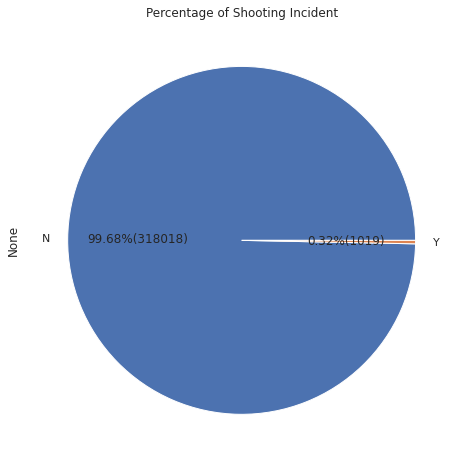

In [41]:
# Tampilkan proporsi piechart
shooting = df.groupby('SHOOTING').size()

sns.set()
shooting.plot(kind = 'pie', title = 'Percentage of Shooting Incident', figsize = [8,8],
          autopct = lambda p: '{:.2f}%({:.0f})'.format(p,(p/100)*shooting.sum()))
plt.show()

**`OCCURED_ON_DATE`**

- Kolom ini memiliki tipe data object, harus diubah ke tipe data datetime agar dapat dianalisa lebih lanjut
- data tanggal dan jam dipisah ke kolom baru sesuai tanggal dan waktu terjadinya tindak kriminal
- informasi pada kolom `YEAR`, `MONTH`, `DAY_OF_WEEK`, `HOUR` kita hapus karena data sudah tersedia pada kolom `OCCURED_ON_DATE`

In [42]:
# pisahkan tanggal dan waktu ke kolom baru

df['DATE'] = df['OCCURRED_ON_DATE'].str[:11]
df['TIME'] = df['OCCURRED_ON_DATE'].str[-8:]
df

,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_CODE_GROUP,DISTRICT,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,STREET,Lat,Long,Location,NAME,CASE_COUNT,DISTRICT_No,DATE,TIME
index,,,,,,,,,,,,,,,,,,,,
142052550-3125,142052550,3125,Warrant Arrests,South End,N,2015-06-22 00:12:00,2015,6,Monday,0,Part Three,WASHINGTON ST,42.333839,-71.08029,"(42.33383935, -71.08029038)",WARRANT ARREST,1,D4,2015-06-22,00:12:00
I010370257-00-3125,I010370257-00,3125,Warrant Arrests,Jamaica Plain,N,2016-05-31 19:35:00,2016,5,Tuesday,19,Part Three,NEW WASHINGTON ST,42.302333,-71.111565,"(42.30233307, -71.11156487)",WARRANT ARREST,1,E13,2016-05-31,19:35:00
I030217815-08-111,I030217815-08,111,Homicide,Hyde Park,N,2015-07-09 13:38:00,2015,7,Thursday,13,Part One,RIVER ST,42.255926,-71.123172,"(42.25592648, -71.12317207)",MURDER NON-NEGLIGIENT MANSLAUGHTER,1,E18,2015-07-09,13:38:00
I030217815-08-3125,I030217815-08,3125,Warrant Arrests,Hyde Park,N,2015-07-09 13:38:00,2015,7,Thursday,13,Part Three,RIVER ST,42.255926,-71.123172,"(42.25592648, -71.12317207)",WARRANT ARREST,1,E18,2015-07-09,13:38:00
I050310906-00-3125,I050310906-00,3125,Warrant Arrests,South End,N,2016-06-05 17:25:00,2016,6,Sunday,17,Part Three,COVENTRY ST,42.336951,-71.085748,"(42.33695098, -71.08574813)",WARRANT ARREST,1,D4,2016-06-05,17:25:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
I182070938-3114,I182070938,3114,Investigate Property,Mattapan,N,2018-09-03 21:05:00,2018,9,Monday,21,Part Three,DELHI ST,42.275365,-71.090361,"(42.27536542, -71.09036101)",INVESTIGATE PROPERTY,1,B3,2018-09-03,21:05:00
I182070940-3114,I182070940,3114,Investigate Property,South End,N,2018-09-03 21:16:00,2018,9,Monday,21,Part Three,NEWCOMB ST,42.334182,-71.078664,"(42.33418175, -71.07866441)",INVESTIGATE PROPERTY,1,D4,2018-09-03,21:16:00
I182070941-3410,I182070941,3410,Towed,South End,N,2018-09-03 19:27:00,2018,9,Monday,19,Part Three,CAZENOVE ST,42.346589,-71.072429,"(42.34658879, -71.07242943)",TOWED MOTOR VEHICLE,1,D4,2018-09-03,19:27:00


In [43]:
# ubah tipe datanya ke datetime

df['DATE'] = pd.to_datetime(df['DATE'])
df['TIME'] = pd.to_datetime(df['TIME'])
df.dtypes

INCIDENT_NUMBER               object
OFFENSE_CODE                   int64
OFFENSE_CODE_GROUP            object
DISTRICT                      object
SHOOTING                      object
OCCURRED_ON_DATE              object
YEAR                           int64
MONTH                          int64
DAY_OF_WEEK                   object
HOUR                           int64
UCR_PART                      object
STREET                        object
Lat                           object
Long                          object
Location                      object
NAME                          object
CASE_COUNT                     int64
DISTRICT_No                   object
DATE                  datetime64[ns]
TIME                  datetime64[ns]
dtype: object

In [44]:
# drop YEAR, MONTH, DAY_OF_WEEK, HOUR, OCCURED_ON_DATE. hanya gunakan kolom DATE and TIME

df.drop(['OCCURRED_ON_DATE','YEAR','MONTH','DAY_OF_WEEK','HOUR'], axis = 1, inplace = True)
df.head()

,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_CODE_GROUP,DISTRICT,SHOOTING,UCR_PART,STREET,Lat,Long,Location,NAME,CASE_COUNT,DISTRICT_No,DATE,TIME
index,,,,,,,,,,,,,,,
142052550-3125,142052550,3125,Warrant Arrests,South End,N,Part Three,WASHINGTON ST,42.333839,-71.08029,"(42.33383935, -71.08029038)",WARRANT ARREST,1,D4,2015-06-22,2022-10-09 00:12:00
I010370257-00-3125,I010370257-00,3125,Warrant Arrests,Jamaica Plain,N,Part Three,NEW WASHINGTON ST,42.302333,-71.111565,"(42.30233307, -71.11156487)",WARRANT ARREST,1,E13,2016-05-31,2022-10-09 19:35:00
I030217815-08-111,I030217815-08,111,Homicide,Hyde Park,N,Part One,RIVER ST,42.255926,-71.123172,"(42.25592648, -71.12317207)",MURDER NON-NEGLIGIENT MANSLAUGHTER,1,E18,2015-07-09,2022-10-09 13:38:00
I030217815-08-3125,I030217815-08,3125,Warrant Arrests,Hyde Park,N,Part Three,RIVER ST,42.255926,-71.123172,"(42.25592648, -71.12317207)",WARRANT ARREST,1,E18,2015-07-09,2022-10-09 13:38:00
I050310906-00-3125,I050310906-00,3125,Warrant Arrests,South End,N,Part Three,COVENTRY ST,42.336951,-71.085748,"(42.33695098, -71.08574813)",WARRANT ARREST,1,D4,2016-06-05,2022-10-09 17:25:00


In [45]:
#buat kolom baru untuk analisa

col_date = df['DATE'].dt
df['YEAR'] = col_date.year
df['MONTH_NAME'] = col_date.month_name()
df['DAY_NAME'] = col_date.day_name()
df['DAY'] = (col_date.dayofweek)+1
df['WEEKEND'] = df['DAY'].apply(lambda x:'Yes' if x>5 else 'No')
df['QUARTER'] = col_date.to_period('Q')
col_time = df['TIME'].dt
df['Hour'] = col_time.hour
df.head()


,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_CODE_GROUP,DISTRICT,SHOOTING,UCR_PART,STREET,Lat,Long,Location,...,DISTRICT_No,DATE,TIME,YEAR,MONTH_NAME,DAY_NAME,DAY,WEEKEND,QUARTER,Hour
index,,,,,,,,,,,,,,,,,,,,,
142052550-3125,142052550,3125,Warrant Arrests,South End,N,Part Three,WASHINGTON ST,42.333839,-71.08029,"(42.33383935, -71.08029038)",...,D4,2015-06-22,2022-10-09 00:12:00,2015,June,Monday,1,No,2015Q2,0
I010370257-00-3125,I010370257-00,3125,Warrant Arrests,Jamaica Plain,N,Part Three,NEW WASHINGTON ST,42.302333,-71.111565,"(42.30233307, -71.11156487)",...,E13,2016-05-31,2022-10-09 19:35:00,2016,May,Tuesday,2,No,2016Q2,19
I030217815-08-111,I030217815-08,111,Homicide,Hyde Park,N,Part One,RIVER ST,42.255926,-71.123172,"(42.25592648, -71.12317207)",...,E18,2015-07-09,2022-10-09 13:38:00,2015,July,Thursday,4,No,2015Q3,13
I030217815-08-3125,I030217815-08,3125,Warrant Arrests,Hyde Park,N,Part Three,RIVER ST,42.255926,-71.123172,"(42.25592648, -71.12317207)",...,E18,2015-07-09,2022-10-09 13:38:00,2015,July,Thursday,4,No,2015Q3,13
I050310906-00-3125,I050310906-00,3125,Warrant Arrests,South End,N,Part Three,COVENTRY ST,42.336951,-71.085748,"(42.33695098, -71.08574813)",...,D4,2016-06-05,2022-10-09 17:25:00,2016,June,Sunday,7,Yes,2016Q2,17


**`UCR_PART`**

UCR adalah program penegakan hukum kota, kabupaten, dan negara bagian yang memberikan pandangan nasional tentang kejahatan berdasarkan pengajuan
statistik oleh lembaga penegak hukum di seluruh negeri([UCR Handbook Pg. 1](https://rccd.nv.gov/uploadedFiles/gsdnvgov/content/About/UCR/FAQsforUCR.pdf))

- Part I : raditional Summary Reporting System (SRS) and the National Incident-Based Reporting System (NIBRS) – Offense and arrest data
  - Violent = Aggravated assault, forcible rape, murder, and robbery
  - Property Crimes = arson, burglary, larceny-theft, and motor vehicle theft

- Part II : Law Enforcement Officers Killed and Assaulted (LEOKA) Program
  - simple assault, curfew offenses and loitering, embezzlement, forgery and counterfeiting, disorderly conduct, driving under the influence, drug offenses, fraud, gambling, liquor offenses, offenses against the family, prostitution, public drunkenness, runaways, sex offenses, stolen property, vandalism, vagrancy, and weapons offenses

- Part III : Hate Crime Statistics Program
  - When a perpetrator targets a victim because of their membership (or perceived membership) of a certain social group or racial demographic.

- Part IV : Cargo Theft Reporting Program
  - Taking possession of a package or its contents, outside of a residence or business, where it has been commercially delivered or has been left for commercial pickup, with intent to deprive the rightful owner of the contents

In [46]:
# Jumlah kasus tiap UCR
(pd.crosstab(index = df['UCR_PART'], columns = 'TOTAL_CASES(%)', normalize = True)*100).round(2).sort_values('TOTAL_CASES(%)', ascending = False)

col_0,TOTAL_CASES(%)
UCR_PART,
Part Three,49.69
Part Two,30.58
Part One,19.32
Other,0.39
N/A,0.03


**`STREET`**

lokasi / nama jalan dimana tindak kriminal terjadi

In [47]:
# Jumlah kasus sesuai nama jalan

(pd.crosstab(index = df['STREET'], columns = 'TOTAL_CASES(%)',normalize = True)*100).round(2).sort_values('TOTAL_CASES(%)', ascending = False)

col_0,TOTAL_CASES(%)
STREET,
WASHINGTON ST,4.45
N/A,3.41
BLUE HILL AVE,2.44
BOYLSTON ST,2.26
DORCHESTER AVE,1.61
...,...
MARYKNOLL TER,0.00
COTTING ST,0.00
MASCOMA ST,0.00


Kolom `STREET` akan dihapus, karena jumlah nama jalan terlalu banyak sejumlah 4658 nama jalan dan missing value sebanyak 3.41% dari populasi.

Sebagai gantinya akan digunakan district dan coordinate untuk analisa

In [48]:
# drop kolom street
df = df.drop('STREET',axis = 1)
df

,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_CODE_GROUP,DISTRICT,SHOOTING,UCR_PART,Lat,Long,Location,NAME,...,DISTRICT_No,DATE,TIME,YEAR,MONTH_NAME,DAY_NAME,DAY,WEEKEND,QUARTER,Hour
index,,,,,,,,,,,,,,,,,,,,,
142052550-3125,142052550,3125,Warrant Arrests,South End,N,Part Three,42.333839,-71.08029,"(42.33383935, -71.08029038)",WARRANT ARREST,...,D4,2015-06-22,2022-10-09 00:12:00,2015,June,Monday,1,No,2015Q2,0
I010370257-00-3125,I010370257-00,3125,Warrant Arrests,Jamaica Plain,N,Part Three,42.302333,-71.111565,"(42.30233307, -71.11156487)",WARRANT ARREST,...,E13,2016-05-31,2022-10-09 19:35:00,2016,May,Tuesday,2,No,2016Q2,19
I030217815-08-111,I030217815-08,111,Homicide,Hyde Park,N,Part One,42.255926,-71.123172,"(42.25592648, -71.12317207)",MURDER NON-NEGLIGIENT MANSLAUGHTER,...,E18,2015-07-09,2022-10-09 13:38:00,2015,July,Thursday,4,No,2015Q3,13
I030217815-08-3125,I030217815-08,3125,Warrant Arrests,Hyde Park,N,Part Three,42.255926,-71.123172,"(42.25592648, -71.12317207)",WARRANT ARREST,...,E18,2015-07-09,2022-10-09 13:38:00,2015,July,Thursday,4,No,2015Q3,13
I050310906-00-3125,I050310906-00,3125,Warrant Arrests,South End,N,Part Three,42.336951,-71.085748,"(42.33695098, -71.08574813)",WARRANT ARREST,...,D4,2016-06-05,2022-10-09 17:25:00,2016,June,Sunday,7,Yes,2016Q2,17
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
I182070938-3114,I182070938,3114,Investigate Property,Mattapan,N,Part Three,42.275365,-71.090361,"(42.27536542, -71.09036101)",INVESTIGATE PROPERTY,...,B3,2018-09-03,2022-10-09 21:05:00,2018,September,Monday,1,No,2018Q3,21
I182070940-3114,I182070940,3114,Investigate Property,South End,N,Part Three,42.334182,-71.078664,"(42.33418175, -71.07866441)",INVESTIGATE PROPERTY,...,D4,2018-09-03,2022-10-09 21:16:00,2018,September,Monday,1,No,2018Q3,21
I182070941-3410,I182070941,3410,Towed,South End,N,Part Three,42.346589,-71.072429,"(42.34658879, -71.07242943)",TOWED MOTOR VEHICLE,...,D4,2018-09-03,2022-10-09 19:27:00,2018,September,Monday,1,No,2018Q3,19


**`LOCATION`**

Location akan merepresentasikan koordinat, yaitu memiliki element latitude dan longitude. Artinya kolom `Lat` dan `Long` dapat kita drop agar lebih efisien

In [49]:
# Drop Lat dan Long

df = df.drop('Long',axis = 1)
df = df.drop('Lat',axis = 1)

In [50]:
# Buat lat and long yang baru
new_location = df['Location'].str.split(',',expand = True)
df['Lat'] = new_location[0].str.replace('(','',regex = True)
df['Long'] = new_location[1].str.replace(')','',regex = True)
df.head()

,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_CODE_GROUP,DISTRICT,SHOOTING,UCR_PART,Location,NAME,CASE_COUNT,DISTRICT_No,...,TIME,YEAR,MONTH_NAME,DAY_NAME,DAY,WEEKEND,QUARTER,Hour,Lat,Long
index,,,,,,,,,,,,,,,,,,,,,
142052550-3125,142052550,3125,Warrant Arrests,South End,N,Part Three,"(42.33383935, -71.08029038)",WARRANT ARREST,1,D4,...,2022-10-09 00:12:00,2015,June,Monday,1,No,2015Q2,0,42.33383935,-71.08029038
I010370257-00-3125,I010370257-00,3125,Warrant Arrests,Jamaica Plain,N,Part Three,"(42.30233307, -71.11156487)",WARRANT ARREST,1,E13,...,2022-10-09 19:35:00,2016,May,Tuesday,2,No,2016Q2,19,42.30233307,-71.11156487
I030217815-08-111,I030217815-08,111,Homicide,Hyde Park,N,Part One,"(42.25592648, -71.12317207)",MURDER NON-NEGLIGIENT MANSLAUGHTER,1,E18,...,2022-10-09 13:38:00,2015,July,Thursday,4,No,2015Q3,13,42.25592648,-71.12317207
I030217815-08-3125,I030217815-08,3125,Warrant Arrests,Hyde Park,N,Part Three,"(42.25592648, -71.12317207)",WARRANT ARREST,1,E18,...,2022-10-09 13:38:00,2015,July,Thursday,4,No,2015Q3,13,42.25592648,-71.12317207
I050310906-00-3125,I050310906-00,3125,Warrant Arrests,South End,N,Part Three,"(42.33695098, -71.08574813)",WARRANT ARREST,1,D4,...,2022-10-09 17:25:00,2016,June,Sunday,7,Yes,2016Q2,17,42.33695098,-71.08574813


In [51]:
# Tampilkan data untuk analisis (data sudah cleaning dan understanding)
df

,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_CODE_GROUP,DISTRICT,SHOOTING,UCR_PART,Location,NAME,CASE_COUNT,DISTRICT_No,...,TIME,YEAR,MONTH_NAME,DAY_NAME,DAY,WEEKEND,QUARTER,Hour,Lat,Long
index,,,,,,,,,,,,,,,,,,,,,
142052550-3125,142052550,3125,Warrant Arrests,South End,N,Part Three,"(42.33383935, -71.08029038)",WARRANT ARREST,1,D4,...,2022-10-09 00:12:00,2015,June,Monday,1,No,2015Q2,0,42.33383935,-71.08029038
I010370257-00-3125,I010370257-00,3125,Warrant Arrests,Jamaica Plain,N,Part Three,"(42.30233307, -71.11156487)",WARRANT ARREST,1,E13,...,2022-10-09 19:35:00,2016,May,Tuesday,2,No,2016Q2,19,42.30233307,-71.11156487
I030217815-08-111,I030217815-08,111,Homicide,Hyde Park,N,Part One,"(42.25592648, -71.12317207)",MURDER NON-NEGLIGIENT MANSLAUGHTER,1,E18,...,2022-10-09 13:38:00,2015,July,Thursday,4,No,2015Q3,13,42.25592648,-71.12317207
I030217815-08-3125,I030217815-08,3125,Warrant Arrests,Hyde Park,N,Part Three,"(42.25592648, -71.12317207)",WARRANT ARREST,1,E18,...,2022-10-09 13:38:00,2015,July,Thursday,4,No,2015Q3,13,42.25592648,-71.12317207
I050310906-00-3125,I050310906-00,3125,Warrant Arrests,South End,N,Part Three,"(42.33695098, -71.08574813)",WARRANT ARREST,1,D4,...,2022-10-09 17:25:00,2016,June,Sunday,7,Yes,2016Q2,17,42.33695098,-71.08574813
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
I182070938-3114,I182070938,3114,Investigate Property,Mattapan,N,Part Three,"(42.27536542, -71.09036101)",INVESTIGATE PROPERTY,1,B3,...,2022-10-09 21:05:00,2018,September,Monday,1,No,2018Q3,21,42.27536542,-71.09036101
I182070940-3114,I182070940,3114,Investigate Property,South End,N,Part Three,"(42.33418175, -71.07866441)",INVESTIGATE PROPERTY,1,D4,...,2022-10-09 21:16:00,2018,September,Monday,1,No,2018Q3,21,42.33418175,-71.07866441
I182070941-3410,I182070941,3410,Towed,South End,N,Part Three,"(42.34658879, -71.07242943)",TOWED MOTOR VEHICLE,1,D4,...,2022-10-09 19:27:00,2018,September,Monday,1,No,2018Q3,19,42.34658879,-71.07242943


In [52]:
df.to_csv('Capstone_Project2_Aria_Dipa.csv')

## DATA ANALYSIS



### Trend Number of Incident Reported through 14 Juni 2015 - 3 Sept 2018

Total cases pada periode 14 Juni 2015 - 3 Sept 2018 harus dipetakan terlebih dahulu agar dapat dilihat trend pertahunnya

In [53]:
case_per_year = pd.crosstab(index = df['YEAR'], columns = 'TOTAL_CASES', values = df['CASE_COUNT'], aggfunc = 'sum')
case_per_year['YEAR'] = case_per_year.index.astype(str)
print(f'Jumlah kasus di 2015 ketika disetahunkan adalah {(case_per_year[case_per_year["YEAR"]=="2015"]["TOTAL_CASES"]/199*365).round(0)} kasus') #14 Jun - 31 Dec '15 berjumlah 199 hari
print(f'Jumlah kasus di 2018 ketika disetahunkan adalah {(case_per_year[case_per_year["YEAR"]=="2018"]["TOTAL_CASES"]/245*365).round(0)} kasus') #1 Jan - 3 Sep '18 berjumlah 245 hari

Jumlah kasus di 2015 ketika disetahunkan adalah YEAR
2015    97877.0
Name: TOTAL_CASES, dtype: float64 kasus
Jumlah kasus di 2018 ketika disetahunkan adalah YEAR
2018    97857.0
Name: TOTAL_CASES, dtype: float64 kasus


In [54]:
case_per_year.loc[case_per_year['YEAR']=='2015','TOTAL_CASES']=97877
case_per_year.loc[case_per_year['YEAR']=='2018','TOTAL_CASES']=97857 
case_per_year

col_0,TOTAL_CASES,YEAR
YEAR,,
2015,97877,2015
2016,99106,2016
2017,100883,2017
2018,97857,2018


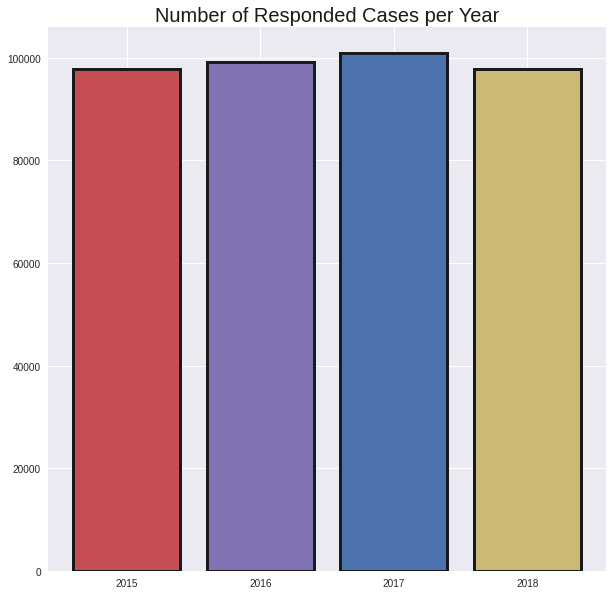

In [55]:
# Tampilkan trend per tahun 

# case_per_year['YEAR'] = case_per_year.index.astype('int64')
plt.style.use('seaborn')
plt.figure(figsize = (10,10))
# sns.lineplot(x = case_per_year['YEAR'], y = case_per_year['TOTAL_CASES'], color = 'red',linewidth = 3)
plt.bar(case_per_year['YEAR'],case_per_year['TOTAL_CASES'],
    color = ('r','m','b','y'),
    edgecolor = 'k',
    linewidth = 3
    )
plt.title('Number of Responded Cases per Year', size = 20, color = 'k')
plt.show()



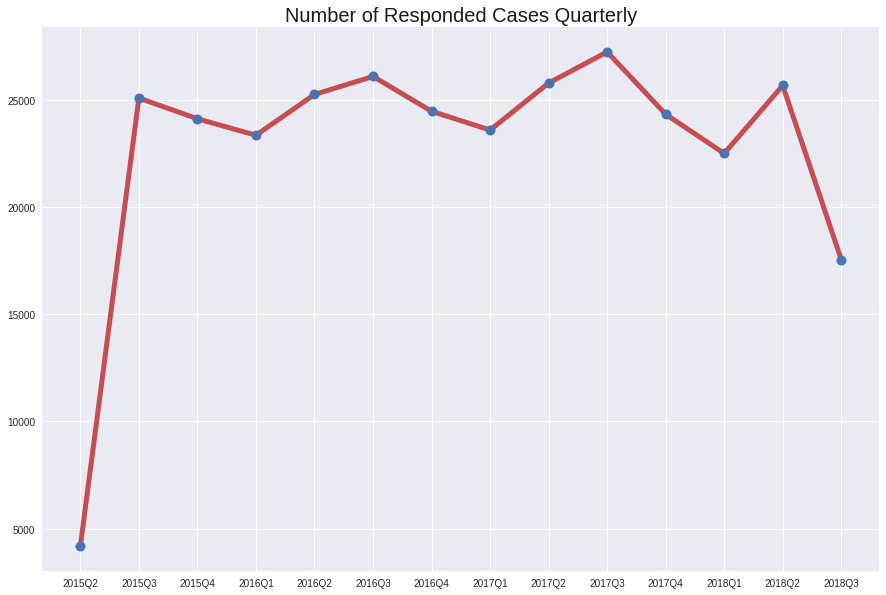

In [56]:
# tampilkan trend quarterly

case_per_quarter = pd.crosstab(index=df['QUARTER'], columns = 'TOTAL_CASES', values = df['CASE_COUNT'], aggfunc = 'sum')
case_per_quarter['QUARTER'] = case_per_quarter.index.astype(str)

plt.figure(figsize = (15,10))
plt.style.use('seaborn')
plt.plot(case_per_quarter['QUARTER'],case_per_quarter['TOTAL_CASES'],
        color = 'r',
        marker = 'o',
        markerfacecolor = 'b',
        markersize = 10,
        markeredgecolor = 'k',
        linestyle = '-',
        linewidth = 5)

plt.title('Number of Responded Cases Quarterly', size = 20, color = 'k')
plt.show()

1. Jumlah tindakan polisi atas insiden yang terjadi pada periode 14 Juni 2015 - 3 Sept 2018 cenderung stabil dengan kisaran 97ribu - 100ribu respon per tahun
2. Tindakan polisi atas insiden per quartal pada periode 14 Juni 2015 - 3 Sept 2018 cukup stabil. Terjadi anomali kelonjakan pada Q3 tahun 2015 disebabkan adanya batasan periode pada data yang tersedia, sehingga Q2 tidak penuh, hanya ada 17 hari yang tercatat.
3. Pada Q3 tahun 2018 terlihat terjadi penurunan yang cukup signifikan, hal inipun terjadi karena adanya batasan periode pada data yang tersedia, Q3 dapat dikatakan complete apabila data tersedia hingga bulan September berakhir (30 Sept)


###Number of Incident Based on Type of Crimes within 14 Juni 2015 - 3 Sept 2018

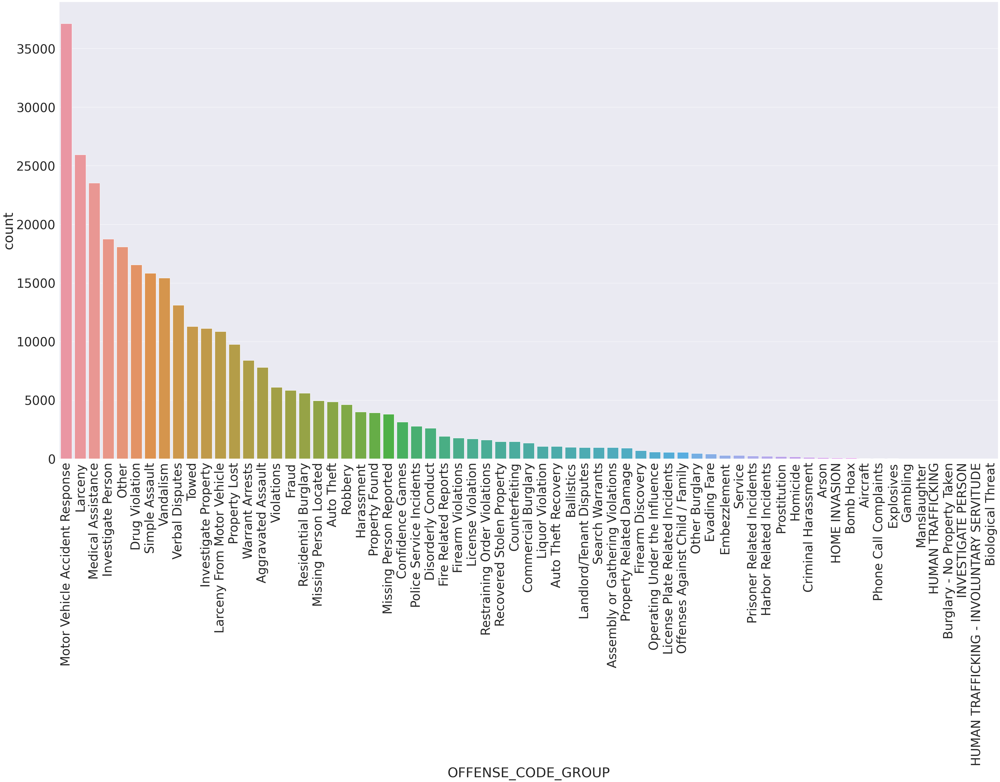

In [86]:
#Tampilkan Number of Incident Based on Type of Crimes

sns.set(font_scale=4.0)
fig, axes = plt.subplots(nrows=1,ncols=1)
fig.set_size_inches(60, 30)
ax = sns.countplot(data=df,x=df['OFFENSE_CODE_GROUP'],order=df['OFFENSE_CODE_GROUP'].value_counts().index, orient="v")
axes.set_xticklabels(ax.get_xticklabels(),rotation=90)
plt.show()



**Dari data diatas ada beberapa hal yang dapat diperhatikan**


1. respon polisi paling banyak terjadi pada MV Accident Response
2. peringkat kedua adalah Larceny (serious crime)
3. peringkat ketiga adalah Medical Assistance
4. yang paling sedikit adalah Biological Threat dan Human Trafficking 


###Number of Incident group by UCR Part

In [58]:
case_by_UCR = pd.crosstab(index = df['UCR_PART'], columns = 'TOTAL_CASES').sort_values('TOTAL_CASES', ascending = False)
case_by_UCR['%'] = (pd.crosstab(index = df['UCR_PART'], columns = 'TOTAL_CASES', normalize = True)*100).round(2).sort_values('TOTAL_CASES', ascending = False)
case_by_UCR.drop('N/A', axis = 0, inplace = True) # drop yang dikategorikan N/A
case_by_UCR.rename(index = {'Other':'Part Four'}, inplace = True) # Other direplace menjadi Part Four karena UCR hanya memiliki 4 part
case_by_UCR

col_0,TOTAL_CASES,%
UCR_PART,,
Part Three,158535,49.69
Part Two,97557,30.58
Part One,61625,19.32
Part Four,1232,0.39


Rank 1: UCR Part Three


In [59]:
# Tampilkan UCR Three (10 teratas)

UCR_three = pd.crosstab(index = [df['UCR_PART']=='Part Three', df['NAME']], columns = 'TOTAL_CASES').sort_values('TOTAL_CASES', ascending = False)
UCR_three.drop(False, inplace = True) 
UCR_three = UCR_three.droplevel(0) 
UCR_three['Crime_Type'] = UCR_three.index 
pop_UCR_three = UCR_three.pop('Crime_Type') 
UCR_three.insert(0,'Crime_Type', pop_UCR_three)
UCR_three = UCR_three.reset_index() 
UCR_three.drop('NAME', axis = 1, inplace = True) 
UCR_three['%'] = (UCR_three['TOTAL_CASES']*100/UCR_three['TOTAL_CASES'].sum()).round(2) 
UCR_three.head(10)

col_0,Crime_Type,TOTAL_CASES,%
0,SICK/INJURED/MEDICAL - PERSON,18783,11.85
1,INVESTIGATE PERSON,18747,11.83
2,M/V - LEAVING SCENE - PROPERTY DAMAGE,16323,10.30
3,VERBAL DISPUTE,13099,8.26
4,TOWED MOTOR VEHICLE,11287,7.12
5,INVESTIGATE PROPERTY,11124,7.02
6,PROPERTY - LOST,8893,5.61
7,WARRANT ARREST,8392,5.29
8,M/V ACCIDENT - PROPERTY ÊDAMAGE,6557,4.14
9,M/V ACCIDENT - PERSONAL INJURY,5131,3.24


Rank 2: UCR Part Two

In [60]:
# Tampilkan UCR Two (10 teratas)

UCR_two = pd.crosstab(index = [df['UCR_PART']=='Part Two', df['NAME']], columns = 'TOTAL_CASES').sort_values('TOTAL_CASES', ascending = False)
UCR_two.drop(False, inplace = True) 
UCR_two = UCR_two.droplevel(0) 
UCR_two['Crime_Type'] = UCR_two.index 
pop_UCR_two = UCR_two.pop('Crime_Type') 
UCR_two.insert(0,'Crime_Type', pop_UCR_two)
UCR_two = UCR_two.reset_index() 
UCR_two.drop('NAME', axis = 1,inplace = True) 
UCR_two['%'] = (UCR_two['TOTAL_CASES']*100/UCR_two['TOTAL_CASES'].sum()).round(2) 
UCR_two.head(10)

col_0,Crime_Type,TOTAL_CASES,%
0,VANDALISM,15153,15.53
1,ASSAULT & BATTERY,14797,15.17
2,THREATS TO DO BODILY HARM,9042,9.27
3,FRAUD - FALSE PRETENSE,4414,4.52
4,HARASSMENT,4007,4.11
5,TRESPASSING,3252,3.33
6,FRAUD - CREDIT CARD / ATM FRAUD,3147,3.23
7,DRUGS - POSS CLASS B - INTENT TO MFR DIST DISP,2996,3.07
8,VAL - VIOLATION OF AUTO LAW - OTHER,2894,2.97
9,M/V - LEAVING SCENE - PROPERTY DAMAGE,2616,2.68


Rank 3: UCR Part One

In [61]:
# Tampilkan UCR One (10 teratas)

UCR_one = pd.crosstab(index = [df['UCR_PART']=='Part One', df['NAME']], columns = 'TOTAL_CASES').sort_values('TOTAL_CASES',ascending = False)
UCR_one.drop(False, inplace = True) 
UCR_one = UCR_one.droplevel(0) 
UCR_one['Crime_Type'] = UCR_one.index 
pop_UCR_one = UCR_one.pop('Crime_Type') 
UCR_one.insert(0,'Crime_Type',pop_UCR_one)
UCR_one = UCR_one.reset_index() 
UCR_one.drop('NAME',axis = 1, inplace = True) 
UCR_one['%'] = (UCR_one['TOTAL_CASES']*100/UCR_one['TOTAL_CASES'].sum()).round(2) 
UCR_one.head(10)

col_0,Crime_Type,TOTAL_CASES,%
0,LARCENY IN A BUILDING $200 & OVER,9073,14.72
1,LARCENY THEFT FROM MV - NON-ACCESSORY,8894,14.43
2,LARCENY SHOPLIFTING $200 & OVER,7952,12.90
3,LARCENY OTHER $200 & OVER,5970,9.69
4,ASSAULT - AGGRAVATED - BATTERY,4887,7.93
5,AUTO THEFT,3629,5.89
6,ROBBERY - STREET,3056,4.96
7,ASSAULT - AGGRAVATED,2911,4.72
8,BURGLARY - RESIDENTIAL - FORCE,2585,4.19
9,B&E RESIDENCE DAY - NO FORCE,2358,3.83


Rank 4: UCR Part Four

In [62]:
# Tampilkan UCR Four (10 teratas)

UCR_four = pd.crosstab(index = [df['UCR_PART']=='Other', df['NAME']], columns = 'TOTAL_CASES').sort_values('TOTAL_CASES',ascending = False)
UCR_four.drop(False, inplace = True) # simpan hanya value True
UCR_four = UCR_four.droplevel(0) # jadikan single index
UCR_four['Crime_Type'] = UCR_four.index # buat kolom sesuai tipe kriminalitas
pop_UCR_four = UCR_four.pop('Crime_Type') # pindahkan ke index pertama
UCR_four.insert(0,'Crime_Type', pop_UCR_four)
UCR_four = UCR_four.reset_index() # buat kolom index baru untuk ranking
UCR_four.drop('NAME',axis=1,inplace=True) # buang kolom tipe kriminal yang sudah diduplikasi
UCR_four['%'] = (UCR_four['TOTAL_CASES']*100/UCR_four['TOTAL_CASES'].sum()).round(2) # tampilkan persentase dari tiap tipe kriminalitas
UCR_four.head(10)

col_0,Crime_Type,TOTAL_CASES,%
0,RECOVERED - MV RECOVERED IN BOSTON (STOLEN OUT...,1051,85.31
1,ARSON,94,7.63
2,RECOVERED STOLEN PLATE,67,5.44
3,PROPERTY - CONCEALING LEASED,10,0.81
4,MANSLAUGHTER - VEHICLE - NEGLIGENCE,5,0.41
5,MANSLAUGHTER - NON-VEHICLE - NEGLIGENCE,2,0.16
6,B&E RESIDENCE DAY - NO PROP TAKEN,1,0.08
7,B&E NON-RESIDENCE DAY - NO PROP TAKEN,1,0.08
8,KILLING OF FELON BY POLICE,1,0.08


###Timeframe incident happen

Untuk mengetahui seberapa sering terjadi tindak kriminal, mari kita lihat kapan waktu polisi melakukan tindakan terhadap kejadian

secara garis besar timeframe dalam 1 hari dibagi menjadi 2, yaitu siang (day) dan malam (night)
- day: pukul 6 - 17
- night: 18 - 5

In [63]:
# buat fungsi day_night (untuk pengaturan waktu)
def day_night(x):
  if x < 6:
    return 'Night'
  elif x < 18:
    return 'Day'
  else:
    return 'Night'

df['Day/Night'] = df['Hour'].apply(day_night)

In [64]:
# Tampilkan pengelompokan tindakan berdasarkan waktu (day/night)
dayNight_case = pd.crosstab(index = df['Day/Night'], columns = 'TOTAL_CASES').sort_values('TOTAL_CASES', ascending = False)
dayNight_case['%'] = (pd.crosstab(index = df['Day/Night'], columns = 'TOTAL_CASES', normalize = True)*100).round(2)
dayNight_case

col_0,TOTAL_CASES,%
Day/Night,,
Day,184302,57.77
Night,134735,42.23


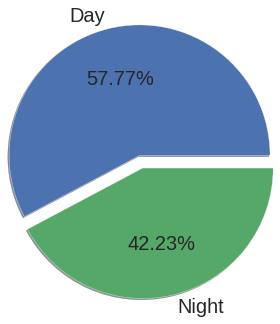

In [65]:
# Tampilkan pie chart pengelompokan tindakan berdasarkan waktu (day/night)

plt.figure(figsize=(4,3))
plt.style.use('seaborn')
plt.pie(dayNight_case['%'], 
        labels = dayNight_case.index, 
        shadow = True, 
        textprops = {'size': 20},
        autopct = '%1.2f%%',
        explode = (0.1, 0.1),
        radius = 2
        )
plt.show()

Berdasarkan data dan grafik diatas, polisi banyak melakukan tindakan pada day time yaitu sebesar 57.77%

Namun jika dilihat hal ini belum spesifik, mari kita petakan menjadi ke 4 bagian

1. Morning: 5 - 12
2. Afternoon:  12 - 17
3. Evening: 17 - 21
4. Night: 21 - 4



In [66]:
# buat fungsi day_part (untuk pengaturan waktu)
def day_part(x):
  if x < 5:
    return 'Night'
  elif x < 12:
    return 'Morning'
  elif x < 17:
    return 'Afternoon'
  elif x < 21:
    return'Evening'
  else:
    return 'Night'

df['DAY_PART'] = df['Hour'].apply(day_part)

In [67]:
# Tampilkan pengelompokan tindakan berdasarkan waktu (day_part)
dayPart_case = pd.crosstab(index = df['DAY_PART'], columns = 'TOTAL_CASES').sort_values('TOTAL_CASES', ascending = False)
dayPart_case['%'] = (pd.crosstab(index = df['DAY_PART'], columns = 'TOTAL_CASES', normalize = True)*100).round(2)
dayPart_case

col_0,TOTAL_CASES,%
DAY_PART,,
Afternoon,89096,27.93
Morning,77756,24.37
Night,77691,24.35
Evening,74494,23.35


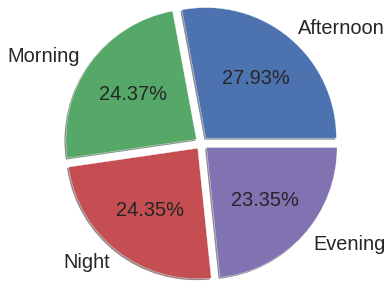

In [68]:
# Tampilkan pie chart pengelompokan tindakan berdasarkan waktu (day_part)

plt.figure(figsize=(4,3))
plt.style.use('seaborn')
plt.pie(dayPart_case['%'], 
        labels = dayPart_case.index, 
        shadow = True, 
        textprops = {'size': 20},
        autopct = '%1.2f%%',
        explode = (0.1, 0.1, 0.1, 0.1),
        radius = 2
        )
plt.show()

Dari data diatas dapat kita lihat bahwa kecenderungan tindakan polisi pada suatu tindak kriminal terjadi paling banyak waktu Afternoon, yaitu sebesar 27.93%. 

Untuk lebih detail mari kita petakan pembagian dalam kurun waktu per jam

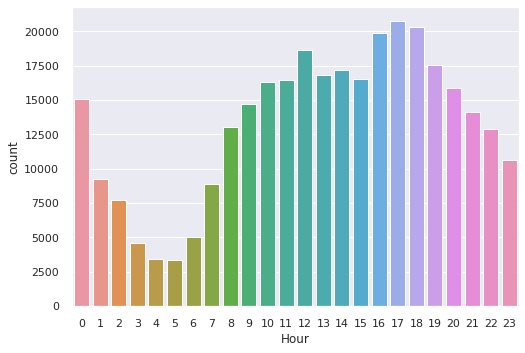

In [69]:
sns.set(font_scale=1.0)
sns.countplot(data=df,x=df['Hour'])

plt.show()


1. Berdasarkan data diatas laporan terjadinya insiden terlihat rendah saat pagi sekitar pukul 4-5 pagi
1. Kasus meningkat seiring berjalannya waktu dari pukul 6 hingga noon time pukul 12 siang
1. Puncak terjadinya insiden ada waktu evening tepatnya pukul 17 sore

### Reported Incident group by District. Highest percentage to lowest

In [70]:
df['Long']=df['Long'].astype('float')
df['Lat']=df['Lat'].astype('float')

In [71]:
busy_location = pd.crosstab(index = [df['Lat'], df['Long']], columns = 'TOTAL_CASES').sort_values('TOTAL_CASES', ascending = False)
busy_location.drop(0.00000, inplace = True) # eliminasi yang latitude and longitudenya 0
busy_location.drop(-1.000000,inplace = True) # eliminasi yang latitude and longitudenya -1
busy_location = busy_location.reset_index(level = [0,1])
busy_location.head(10)

col_0,Lat,Long,TOTAL_CASES
0,42.348624,-71.082776,1243
1,42.361839,-71.059765,1208
2,42.284826,-71.091374,1121
3,42.328663,-71.085634,1042
4,42.256216,-71.124019,898
5,42.297555,-71.059709,783
6,42.341288,-71.054679,773
7,42.331521,-71.070853,735
8,42.352312,-71.063705,688
9,42.339542,-71.069409,655


In [72]:
case_per_district = pd.crosstab(index = [df['DISTRICT_No'], df['DISTRICT']], columns = ['TOTAL_CASES'])
case_per_district.drop('N/A', inplace = True)
case_per_district = case_per_district.reset_index(level=[0,1])
case_per_district

col_0,DISTRICT_No,DISTRICT,TOTAL_CASES
0,A1,Downtown,35708
1,A15,Charlestown,6505
2,A7,East Boston,13544
3,B2,Roxbury,49939
4,B3,Mattapan,35439
5,C11,Dorchester,42526
6,C6,South Boston,23456
7,D14,Brighton,20127
8,D4,South End,41910
9,E13,Jamaica Plain,17533


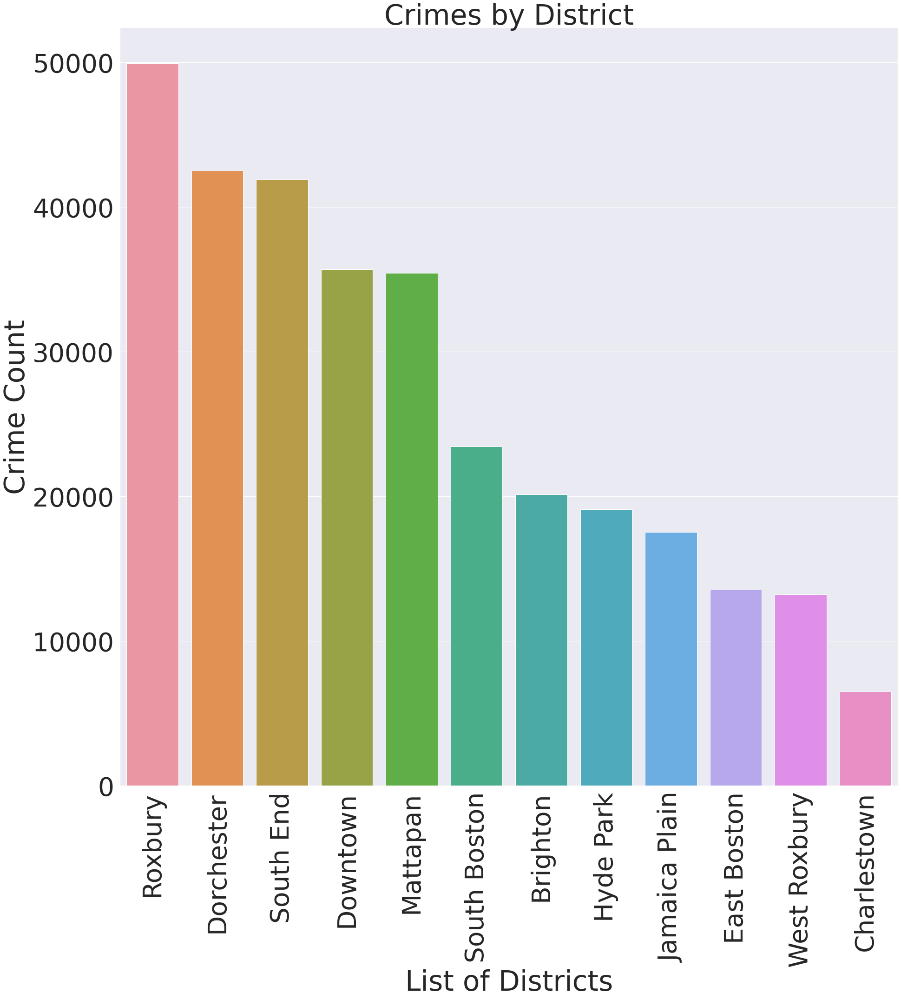

In [88]:
# Tampilkan Highest Number of Report by District

sns.set(font_scale=5.0)
fig, axes = plt.subplots(nrows=1,ncols=1)
fig.set_size_inches(30, 30)
ax = sns.countplot(data=df,x=df['DISTRICT'],order=df['DISTRICT'].value_counts().index, orient="v")
axes.set_xticklabels(ax.get_xticklabels(),rotation=90)
ax.set(xlabel='List of Districts', ylabel='Crime Count',title="Crimes by District")
plt.show()

Berdasarkan data diatas dapat terlihat bahwa Roxburry adalah district yang paling banyak terjadi laporan kejadian, dan district Charlestown terhitung paling sedikit terjadi laporan kejadian

In [74]:
df.head()

,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_CODE_GROUP,DISTRICT,SHOOTING,UCR_PART,Location,NAME,CASE_COUNT,DISTRICT_No,...,MONTH_NAME,DAY_NAME,DAY,WEEKEND,QUARTER,Hour,Lat,Long,Day/Night,DAY_PART
index,,,,,,,,,,,,,,,,,,,,,
142052550-3125,142052550,3125,Warrant Arrests,South End,N,Part Three,"(42.33383935, -71.08029038)",WARRANT ARREST,1,D4,...,June,Monday,1,No,2015Q2,0,42.333839,-71.080290,Night,Night
I010370257-00-3125,I010370257-00,3125,Warrant Arrests,Jamaica Plain,N,Part Three,"(42.30233307, -71.11156487)",WARRANT ARREST,1,E13,...,May,Tuesday,2,No,2016Q2,19,42.302333,-71.111565,Night,Evening
I030217815-08-111,I030217815-08,111,Homicide,Hyde Park,N,Part One,"(42.25592648, -71.12317207)",MURDER NON-NEGLIGIENT MANSLAUGHTER,1,E18,...,July,Thursday,4,No,2015Q3,13,42.255926,-71.123172,Day,Afternoon
I030217815-08-3125,I030217815-08,3125,Warrant Arrests,Hyde Park,N,Part Three,"(42.25592648, -71.12317207)",WARRANT ARREST,1,E18,...,July,Thursday,4,No,2015Q3,13,42.255926,-71.123172,Day,Afternoon
I050310906-00-3125,I050310906-00,3125,Warrant Arrests,South End,N,Part Three,"(42.33695098, -71.08574813)",WARRANT ARREST,1,D4,...,June,Sunday,7,Yes,2016Q2,17,42.336951,-71.085748,Day,Evening


In [75]:
read_map = pd.read_csv('crime.csv', encoding='iso-8859-1')
read_map.Lat.replace(-1, None, inplace=True)
read_map.Long.replace(-1, None, inplace=True)

Peta Boston

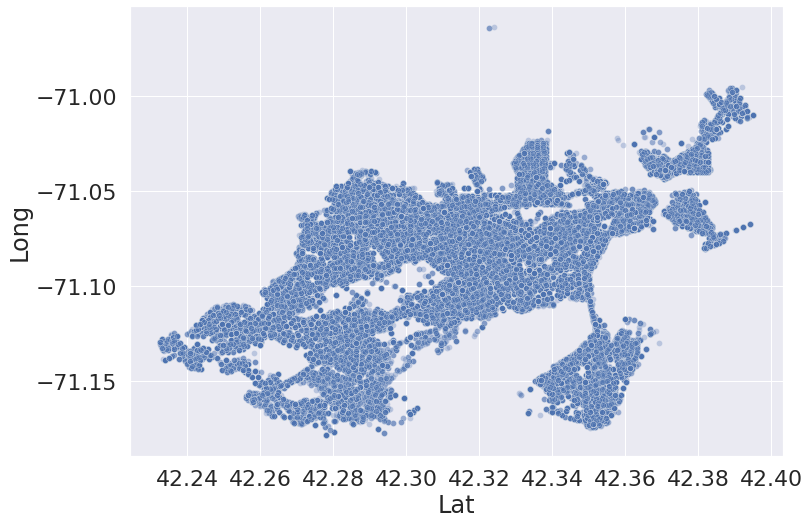

In [76]:
size = (11.7, 8.27)
fig, ax = plt.subplots(figsize = size)
sns.scatterplot(x = 'Lat', y = 'Long', alpha=0.3, data = read_map, ax = ax)
plt.show()

Sebaran District

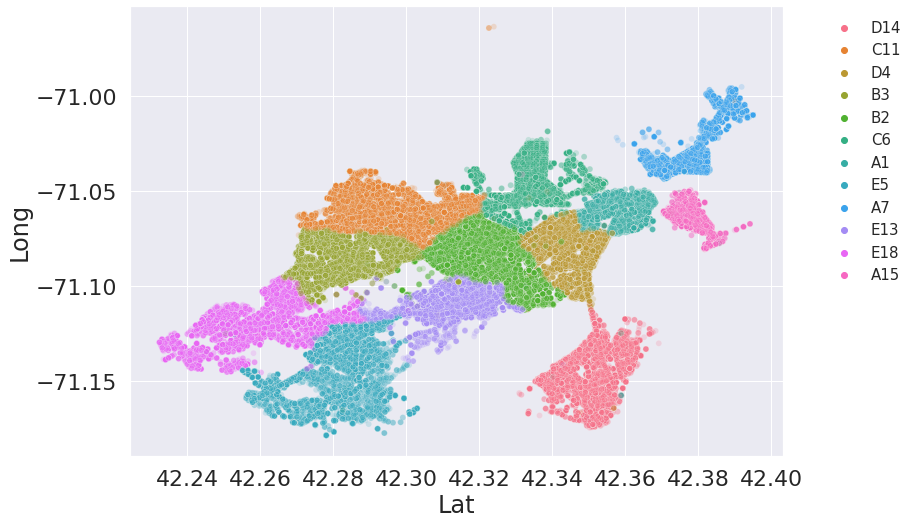

In [77]:
size = (11.7, 8.27)
fig, ax = plt.subplots(figsize = size)
sns.scatterplot(x = 'Lat', y = 'Long', hue = 'DISTRICT', alpha = 0.2, data = read_map, ax = ax)
plt.legend(bbox_to_anchor = (1.05, 1), loc = 2, fontsize = 15)
plt.show()

Titik terjadinya serious crime

In [89]:
from folium.plugins import HeatMap
# Create basic Folium crime map
bos_crime_map = folium.Map(location=[42.3125,-71.0875], 
                       tiles = "Stamen Toner",
                      zoom_start = 11)

# Add data for heatmp 
# data_heatmap = read_map
data_heatmap = read_map[['Lat','Long']]
data_heatmap = read_map.dropna(axis = 0, subset = ['Lat','Long'])
data_heatmap = [[row['Lat'],row['Long']] for index, row in data_heatmap.iterrows()]
HeatMap(data_heatmap, radius = 10).add_to(bos_crime_map)

# Plot!
bos_crime_map

## KESIMPULAN DAN REKOMENDASI

###KESIMPULAN

1. Jumlah total insiden yang dilaporkan terbilang stabil dalam periode 14 Juni 2015 - 3 Sept 2018. Tidak adanya penurunan terhadap jumlah total kasus yang dilaporkan.
1. Kecelakaan Motor Vehicle terlihat merupakan insiden yang paling banyak dilaporkan, namun untuk serious crimes tertinggi adalah Larceny dan ini harus menjadi perhatian khusus
1. Jika dikelompokkan berdasarkan UCR, UCR Part three (hate crimes) merupakan peringkat tertinggi, diikuti UCR Part two (common crimes), kemudian UCR Part one (serious crimes), dan UCR Part four (Cargo theft)
1. Peningkatan terjadinya insiden terlihat pada pagi ke tengah hari (pukul 6 - 12) dan puncaknya di afternoon ke evening (pukul 16 - 18)
1. District dengan persentase serious crime tertinggi dari total insiden yang tercatat adalah Roxbury, diikuti Dorchester, South End, Downtown di peringkat keempat. Charlestown adalah district paling sedikit terjadinya insiden. 

###REKOMENDASI

1. Menambahkan jumlah officer yang akan melakukan patroli, hal ini sangat urgent karena berdasarkan grafik total insiden yang dilaporkan, tidak adanya penurunan yang signifikan selama periode 14 Juni 2015 - 3 Sept 2018.
1. Dikarenakan tingginya tingkat kecelakaan motor vehicle, perlu disosialisasikan ke seluruh masyarakat (dimulai dari jenjang sekolah) untuk menaati aturan lalulintas dan berkendara dengan baik. Selain itu, bekerja sama dengan public service lain seperti pemadam kebakaran dan rumah sakit harus lebih dioptimalkan agar penanganan kecelakaan kendaraan bermotor dapat dihandle lebih efisien.
1. Hate crimes(diskriminasi, hate speech racial, social group, religion, etc) masih menjadi puncak kategori kejatan di Boston. Perlu adanya keseriusan dalam memberi hukuman yang lebih berat kepada pelaku tindak kejahatan tersebut, karena kerugian yang dialami korban akan lebih merugikan dari segi mental dan finansial (biaya pengobatan psikolog/psikiater).
1. Perlu penambahan satuan officer yang siaga dan patroli di jam-jam dengan persentase kejadian insiden tinggi (late morning - evening).
1. Perlu adanya evaluasi satuan unit polisi pada district yang menunjukan persentase insiden yang tinggi, sehingga dapat diteliti lebih lanjut apakah masyarakatnya yang memang cenderung lebih sering melakukan tindak kriminal, atau satuan unit polisinya yang kurang kompeten dibandingkan district lain dengan tingkat insiden yang lebih rendah.

## TABLEAU DASHBOARD

[Story dan Dashboard dapat di akses disini](https://public.tableau.com/views/CapstoneProject2CrimesinBoston/Story1?:language=en-GB&publish=yes&:display_count=n&:origin=viz_share_link)